# Libraries

In [33]:
import numpy as np
import pandas as pd
from itertools import combinations
import matplotlib.pyplot as plt
from matplotlib import cm, colors
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
sns.set()

import warnings
warnings.filterwarnings('ignore')

# Load Dataset

In [34]:
df = pd.read_csv('datasets/Dataset_Visualization.csv')
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
df.head()

,Age,Attrition Status,Business Travel Frequency,Department,Distance From Home (km),Education Level,Education Field,Environment Satisfaction,Gender,Job Involvement,Job Level,Job Role,Job Satisfaction,Marital Status,Monthly Income ($),Count Previous Companies,Works Overtime,Salary Hike (%),Relationship Satisfaction,Stock Option Level,Total Working Years,Training Times Last Year,Work-Life Balance,Years at Company,Years in Current Role,Years Since Last Promotion,Years with Current Manager,Age Group,Income Group,Distance Group,Companies Worked Group,Salary Hike Category,Experience Group,Training Frequency,Company Tenure Group,Role Tenure Group,Promotion Recency Group,Years With Current Manager Group
0,41,Yes,Rarely Travels,Sales,1,Associate,Life Sciences,Medium,Female,High,Mid Level,Sales Executive,Very High,Single,5993,8,Yes,11,Low,No Stock,8,0,Bad,6,4,0,5,36–45,Medium (5k-10k),0-5,6+,Low (11–15%),6–10,Low (0–1),6–10 yrs,3–5 yrs,Recent (<1yr),3–5 yrs
1,49,No,Frequently Travels,Research & Development,8,High School,Life Sciences,High,Male,Medium,Mid Level,Research Scientist,Medium,Married,5130,1,No,23,Very High,Level 1,10,3,Good,10,7,1,7,46–55,Medium (5k-10k),6-10,0–1,High (21–25%),6–10,Medium (2–3),6–10 yrs,6–10 yrs,Recent (<1yr),6–10 yrs
2,37,Yes,Rarely Travels,Research & Development,2,Associate,Other,Very High,Male,Medium,Entry Level,Laboratory Technician,High,Single,2090,6,Yes,15,Medium,No Stock,7,3,Good,0,0,0,0,36–45,Low (1k-5k),0-5,6+,Low (11–15%),6–10,Medium (2–3),<3 yrs,<3 yrs,Recent (<1yr),<3 yrs
3,33,No,Frequently Travels,Research & Development,3,Masters,Life Sciences,Very High,Female,High,Entry Level,Research Scientist,High,Married,2909,1,Yes,11,High,No Stock,8,3,Good,8,7,3,0,26–35,Low (1k-5k),0-5,0–1,Low (11–15%),6–10,Medium (2–3),6–10 yrs,6–10 yrs,1–3 yrs,<3 yrs
4,27,No,Rarely Travels,Research & Development,2,High School,Medical,Low,Male,High,Entry Level,Laboratory Technician,Medium,Married,3468,9,No,12,Very High,Level 1,6,3,Good,2,2,2,2,26–35,Low (1k-5k),0-5,6+,Low (11–15%),6–10,Medium (2–3),<3 yrs,<3 yrs,1–3 yrs,<3 yrs


# Data Exploration

In [35]:
df.shape

(1470, 38)

In [36]:
df.columns

Index(['Age', 'Attrition Status', 'Business Travel Frequency', 'Department',
       'Distance From Home (km)', 'Education Level', 'Education Field',
       'Environment Satisfaction', 'Gender', 'Job Involvement', 'Job Level',
       'Job Role', 'Job Satisfaction', 'Marital Status', 'Monthly Income ($)',
       'Count Previous Companies', 'Works Overtime', 'Salary Hike (%)',
       'Relationship Satisfaction', 'Stock Option Level',
       'Total Working Years', 'Training Times Last Year', 'Work-Life Balance',
       'Years at Company', 'Years in Current Role',
       'Years Since Last Promotion', 'Years with Current Manager', 'Age Group',
       'Income Group', 'Distance Group', 'Companies Worked Group',
       'Salary Hike Category', 'Experience Group', 'Training Frequency',
       'Company Tenure Group', 'Role Tenure Group', 'Promotion Recency Group',
       'Years With Current Manager Group'],
      dtype='object')

In [37]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 38 columns):
 #   Column                            Non-Null Count  Dtype 
---  ------                            --------------  ----- 
 0   Age                               1470 non-null   int64 
 1   Attrition Status                  1470 non-null   object
 2   Business Travel Frequency         1470 non-null   object
 3   Department                        1470 non-null   object
 4   Distance From Home (km)           1470 non-null   int64 
 5   Education Level                   1470 non-null   object
 6   Education Field                   1470 non-null   object
 7   Environment Satisfaction          1470 non-null   object
 8   Gender                            1470 non-null   object
 9   Job Involvement                   1470 non-null   object
 10  Job Level                         1470 non-null   object
 11  Job Role                          1470 non-null   object
 12  Job Satisfaction    

In [38]:
df.describe()

,Age,Distance From Home (km),Monthly Income ($),Count Previous Companies,Salary Hike (%),Total Working Years,Training Times Last Year,Years at Company,Years in Current Role,Years Since Last Promotion,Years with Current Manager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,9.192517,6502.931293,2.693197,15.209524,11.279592,2.799320,7.008163,4.229252,2.187755,4.123129
std,9.135373,8.106864,4707.956783,2.498009,3.659938,7.780782,1.289271,6.126525,3.623137,3.222430,3.568136
min,18.000000,1.000000,1009.000000,0.000000,11.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,2.000000,2911.000000,1.000000,12.000000,6.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,7.000000,4919.000000,2.000000,14.000000,10.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,14.000000,8379.000000,4.000000,18.000000,15.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,29.000000,19999.000000,9.000000,25.000000,40.000000,6.000000,40.000000,18.000000,15.000000,17.000000


# Data Preprocessing

In [39]:
category_orders = {
    'Attrition Status': ['Yes', 'No'],
    'Business Travel Frequency': ['Never Travels', 'Rarely Travels', 'Frequently Travels'],
    'Department': ['Sales', 'Research & Development', 'Human Resources'],
    'Education Level': ['High School', 'Associate', 'Bachelors', 'Masters', 'Doctorate'],
    'Education Field': ['Other', 'Marketing', 'Human Resources', 'Life Sciences', 'Medical', 'Technical Degree'],
    'Environment Satisfaction': ['Low', 'Medium', 'High', 'Very High'],
    'Gender': ['Female', 'Male'],
    'Job Involvement': ['Low', 'Medium', 'High', 'Very High'],
    'Job Level': ['Entry Level', 'Mid Level', 'Senior Level', 'Manager', 'Executive'],
    'Job Role': ['Sales Executive', 'Sales Representative', 'Laboratory Technician', 'Research Scientist', 
                 'Research Director', 'Manufacturing Director', 'Healthcare Representative', 'Manager', 'Human Resources'],
    'Job Satisfaction': ['Low', 'Medium', 'High', 'Very High'],
    'Marital Status': ['Single', 'Married', 'Divorced'],
    'Works Overtime': ['No', 'Yes'],
    'Relationship Satisfaction': ['Low', 'Medium', 'High', 'Very High'],
    'Stock Option Level': ['No Stock', 'Level 1', 'Level 2', 'Level 3'],
    'Work-Life Balance': ['Bad', 'Fair', 'Good', 'Best'],
    'Age Group': ['18–25', '26–35', '36–45', '46–55', '56-60'],
    'Income Group': ['Low (1k-5k)', 'Medium (5k-10k)', 'High (10k-15k)', 'Very High (15k-20K)'],
    'Distance Group': ['0-5', '6-10', '11-20', '21-30'],
    'Companies Worked Group': ['0–1', '2–3', '4–5', '6+'],
    'Salary Hike Category': ['Low (11–15%)', 'Medium (16–20%)', 'High (21–25%)'],
    'Experience Group': ['0–5', '6–10', '11–20', '21–30', '31–40'],
    'Training Frequency': ['Low (0–1)', 'Medium (2–3)', 'High (4–6)'],
    'Company Tenure Group': ['<3 yrs', '3–5 yrs', '6–10 yrs', '11–20 yrs', '21+ yrs'],
    'Role Tenure Group': ['<3 yrs', '3–5 yrs', '6–10 yrs', '11–15 yrs', '16–18 yrs'],
    'Promotion Recency Group': ['Recent (<1yr)', '1–3 yrs', '4–5 yrs', '6–10 yrs', '11–15 yrs'],
    'Years With Current Manager Group': ['<3 yrs', '3–5 yrs', '6–10 yrs', '11–15 yrs', '16–18 yrs']
}


# Data Visualization

In [40]:
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_cols = df.select_dtypes(include=['object']).columns.tolist()
categorical_cols.remove('Attrition Status')

## Seaborn Visualizations

In [41]:
def plot_numerical_features(df, col):
    
    if col == 'Monthly Income ($)':
        print(f"Skipping lineplots for column: {col}")
    plt.figure(figsize=(18, 12))

    # 1. Histogram: All employees
    plt.subplot(2, 3, 1)
    sns.histplot(df[col], kde=True)
    plt.title(f'{col} Distribution (All Employees)')

    # 2. Histogram: by Attrition Status
    plt.subplot(2, 3, 2)
    sns.histplot(data=df, x=col, kde=True, hue='Attrition Status', multiple='stack')
    plt.title(f'{col} Distribution by Attrition Status')

    # 3. Histogram: Attrition Status == Yes
    plt.subplot(2, 3, 3)
    sns.histplot(df[df['Attrition Status'] == 'Yes'][col], kde=True, color='red')
    plt.title(f'{col} Distribution (Attrition = Yes)')

    # 4. Boxplot: All employees
    plt.subplot(2, 3, 4)
    sns.boxplot(x=df[col])
    plt.title(f'{col} Boxplot (All)')

    # 5. Boxplot: by Attrition Status
    plt.subplot(2, 3, 5)
    sns.boxplot(x='Attrition Status', y=col, data=df)
    plt.title(f'{col} Boxplot by Attrition Status')

    plt.tight_layout()
    plt.show()

    if col == 'Monthly Income ($)':
        return

    special_cols = ['Count Previous Companies', 'Salary Hike (%)', 'Training Times Last Year']

    count_all = df.groupby(col).size().reset_index(name='count')

    plt.figure(figsize=(16, 5))
    ax1 = sns.lineplot(data=count_all, x=col, y='count', marker='o')
    plt.title(f'{col} Lineplot: All Employees')
    plt.xlabel(col)
    plt.ylabel('Count')

    if col in special_cols:
        ax1.set_xticks(count_all[col])
        ax1.set_xticklabels(count_all[col], rotation=45)
    else:
        ax1.set_xticklabels([int(x) for x in ax1.get_xticks()])

    if not count_all.empty:
        max_idx = count_all['count'].idxmax()
        min_idx = count_all['count'].idxmin()

        ax1.annotate('Max', xy=(count_all[col][max_idx], count_all['count'][max_idx]),
                     xytext=(count_all[col][max_idx], count_all['count'][max_idx] + 5),
                     color='red', fontweight='bold',
                     arrowprops=dict(arrowstyle='->', color='red', linewidth=2), ha='center')

        ax1.annotate('Min', xy=(count_all[col][min_idx], count_all['count'][min_idx]),
                     xytext=(count_all[col][min_idx], count_all['count'][min_idx] + 5),
                     color='green', fontweight='bold',
                     arrowprops=dict(arrowstyle='->', color='green', linewidth=2), ha='center')

    plt.tight_layout()
    plt.show()

    count_by_attr = df.groupby([col, 'Attrition Status']).size().reset_index(name='count')

    plt.figure(figsize=(16, 5))
    ax2 = sns.lineplot(data=count_by_attr, x=col, y='count', hue='Attrition Status', marker='o')
    plt.title(f'{col} Lineplot: by Attrition Status')
    plt.xlabel(col)
    plt.ylabel('Count')

    if col in special_cols:
        ax2.set_xticks(count_by_attr[col].unique())
        ax2.set_xticklabels(count_by_attr[col].unique(), rotation=0)
    else:
        ax2.set_xticklabels([int(x) for x in ax2.get_xticks()])

    plt.tight_layout()
    plt.show()

    count_yes = df[df['Attrition Status'] == 'Yes'].groupby(col).size().reset_index(name='count')

    plt.figure(figsize=(16, 5))
    ax3 = sns.lineplot(data=count_yes, x=col, y='count', marker='o', color='tomato')
    plt.title(f'{col} Lineplot: Attrition = Yes Only')
    plt.xlabel(col)
    plt.ylabel('Count')

    if col in special_cols:
        ax3.set_xticks(count_yes[col])
        ax3.set_xticklabels(count_yes[col], rotation=0)
    else:
        ax3.set_xticklabels([int(x) for x in ax3.get_xticks()])

    if not count_yes.empty:
        max_idx = count_yes['count'].idxmax()
        min_idx = count_yes['count'].idxmin()

        ax3.annotate('Max', xy=(count_yes[col][max_idx], count_yes['count'][max_idx]),
                     xytext=(count_yes[col][max_idx], count_yes['count'][max_idx] + 2),
                     color='red', fontweight='bold',
                     arrowprops=dict(arrowstyle='->', color='red', linewidth=2), ha='center')

        ax3.annotate('Min', xy=(count_yes[col][min_idx], count_yes['count'][min_idx]),
                     xytext=(count_yes[col][min_idx], count_yes['count'][min_idx] + 2),
                     color='green', fontweight='bold',
                     arrowprops=dict(arrowstyle='->', color='green', linewidth=2), ha='center')

    plt.tight_layout()
    plt.show()

def plot_all_scatterplots(df):
    numerical_cols = df.select_dtypes(include=['number']).columns.tolist()
    col_pairs = list(combinations(numerical_cols, 2))

    for x_col, y_col in col_pairs:
        fig, axs = plt.subplots(1, 3, figsize=(18, 5))
        fig.suptitle(f'Scatterplots: {x_col} vs {y_col}', fontsize=16, fontweight='bold')

        sns.scatterplot(data=df, x=x_col, y=y_col, ax=axs[0], alpha=0.6)
        axs[0].set_title('All Employees')

        sns.scatterplot(data=df, x=x_col, y=y_col, hue='Attrition Status', ax=axs[1], alpha=0.6)
        axs[1].set_title('Color by Attrition Status')

        attr_yes_df = df[df['Attrition Status'] == 'Yes']
        sns.scatterplot(data=attr_yes_df, x=x_col, y=y_col, color='tomato', ax=axs[2], alpha=0.6)
        axs[2].set_title('Attrition = Yes Only')

        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()

def plot_categorical_features(df, col):
    order = category_orders.get(col, df[col].value_counts().index.tolist())
    hue_order = category_orders.get('Attrition Status', df['Attrition Status'].value_counts().index.tolist())

    plt.figure(figsize=(18, 4))

    plt.subplot(1, 3, 1)
    sns.countplot(data=df, x=col, order=order)
    plt.title(f'Countplot of {col}')
    plt.xticks(rotation=45)

    plt.subplot(1, 3, 2)
    sns.countplot(data=df, x=col, hue='Attrition Status', order=order, hue_order=hue_order)
    plt.title(f'{col} by Attrition Status')
    plt.xticks(rotation=45)

    plt.subplot(1, 3, 3)
    sns.countplot(data=df[df['Attrition Status'] == 'Yes'], x=col, order=order, color='red')
    plt.title(f'Attrition = Yes by {col}')
    plt.xticks(rotation=45)

    plt.tight_layout()
    plt.show()

    n = len(order)
    n_cols = min(n, 4)
    n_rows = int(np.ceil(n / n_cols))

    plt.figure(figsize=(n_cols * 4.5, n_rows * 4.5))
    plt.suptitle(f'Attrition % Breakdown per {col} Category', fontsize=16, y=1.02)

    for i, category in enumerate(order):
        plt.subplot(n_rows, n_cols, i + 1)
        subset = df[df[col] == category]['Attrition Status'].value_counts(normalize=True)
        subset = subset.reindex(hue_order, fill_value=0)
        subset.plot.pie(autopct='%1.1f%%', startangle=90, labels=subset.index,
                        colors=['#66b3ff', '#ff9999'])
        plt.title(f"{category}")
        plt.ylabel("")

    plt.tight_layout()
    plt.show()

    yes_df = df[df['Attrition Status'] == 'Yes']
    category_distribution = yes_df[col].value_counts(normalize=True).reindex(order, fill_value=0)

    plt.figure(figsize=(6, 6))
    category_distribution.plot.pie(autopct='%1.1f%%', startangle=90, labels=category_distribution.index,
                                   colors=sns.color_palette("pastel", len(order)))
    plt.title(f'{col} Distribution Among Employees Who Left (Attrition = Yes)')
    plt.ylabel("")
    plt.tight_layout()
    plt.show()



📊 Visualizing numerical column: Age


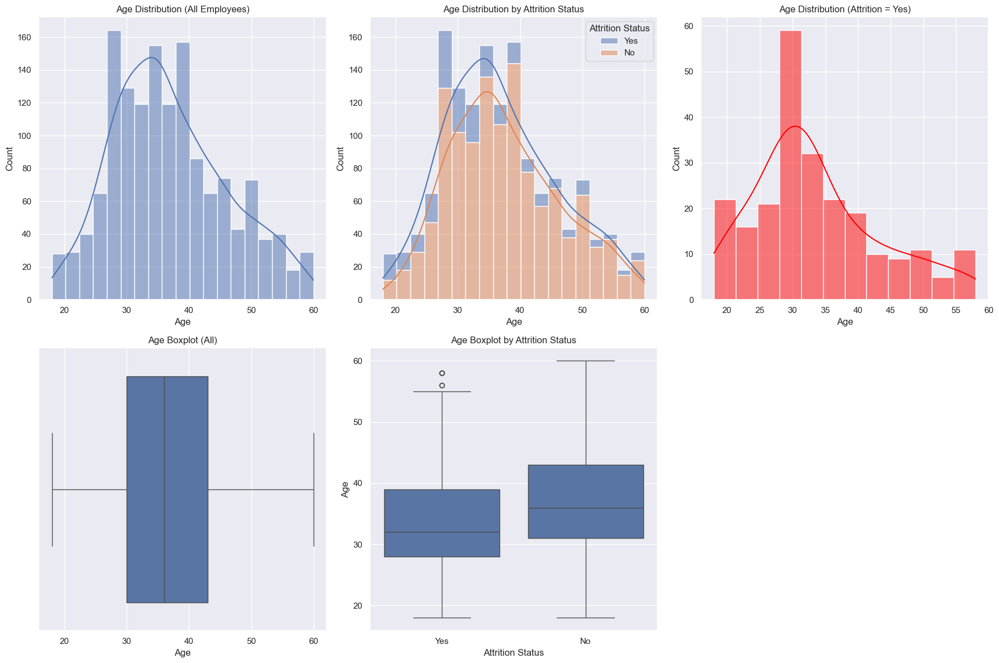

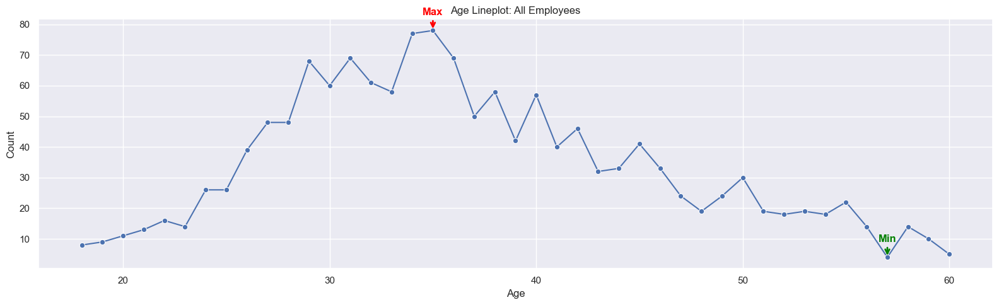

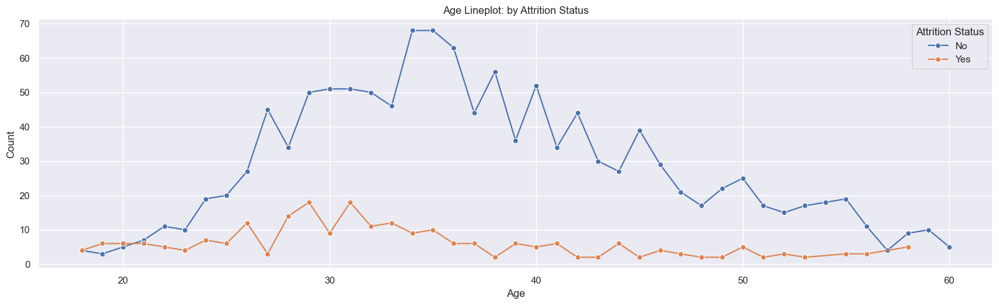

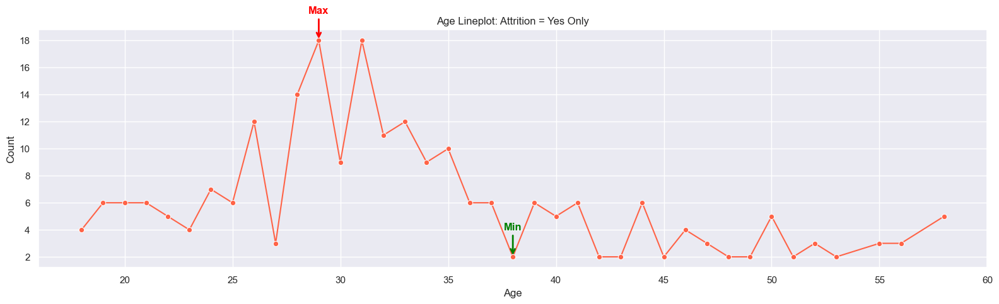


📊 Visualizing numerical column: Distance From Home (km)


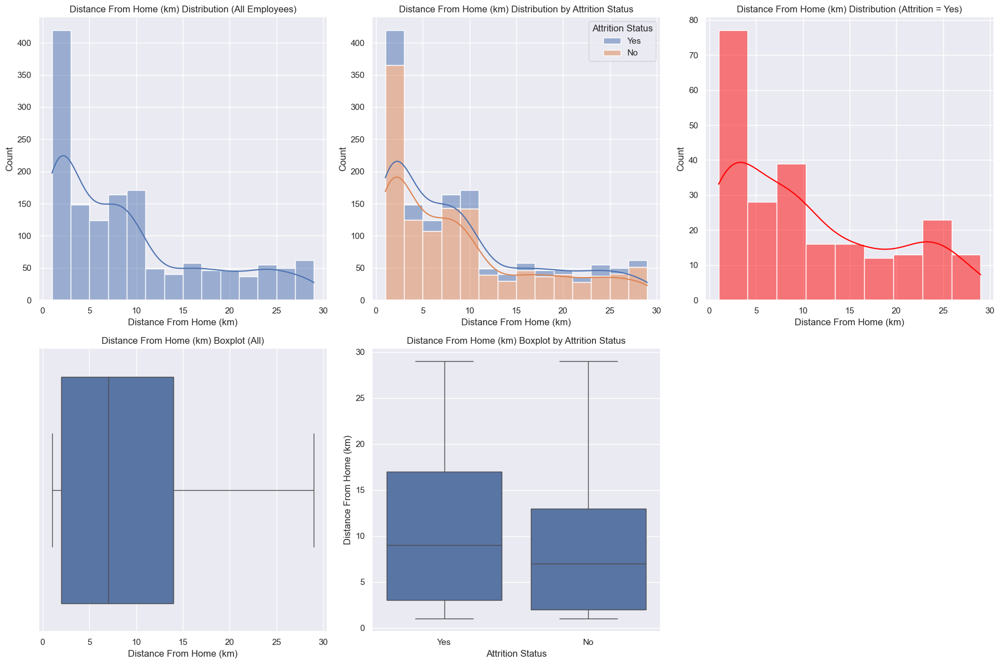

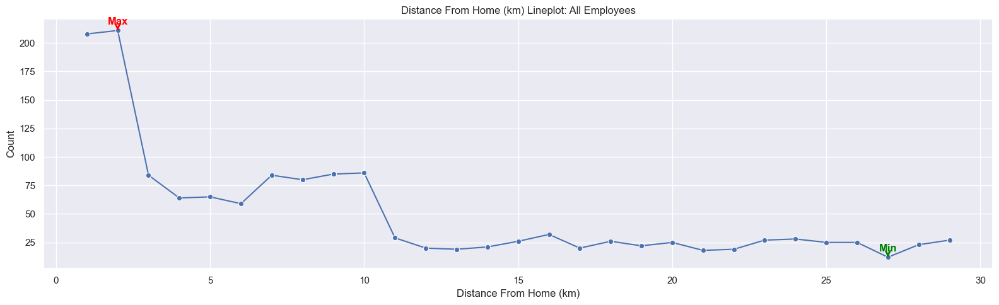

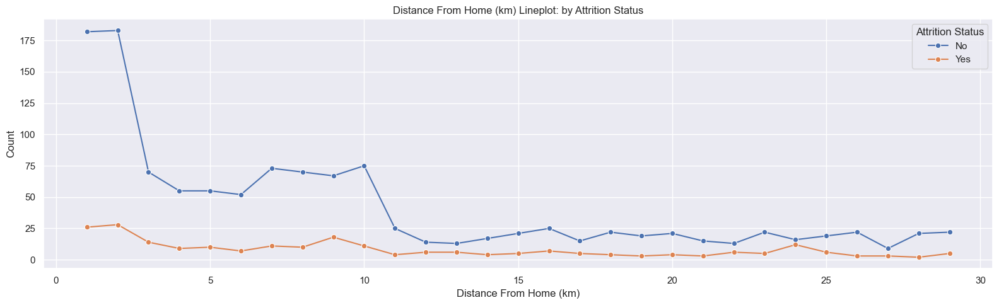

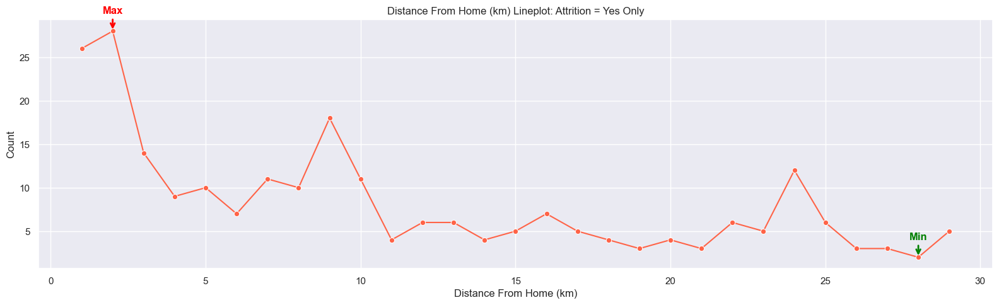


📊 Visualizing numerical column: Monthly Income ($)
Skipping lineplots for column: Monthly Income ($)


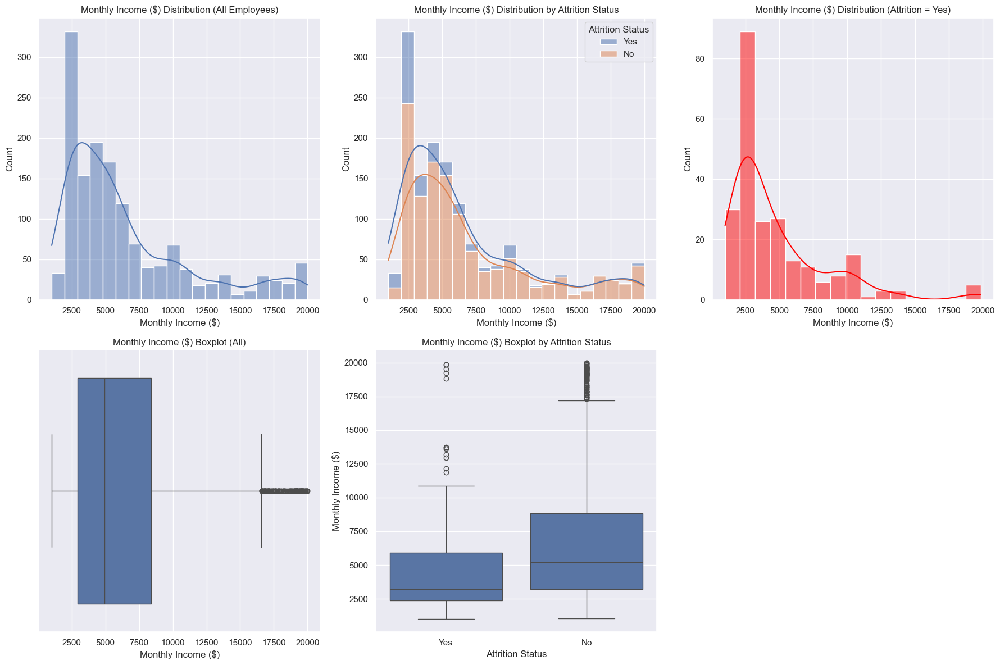


📊 Visualizing numerical column: Count Previous Companies


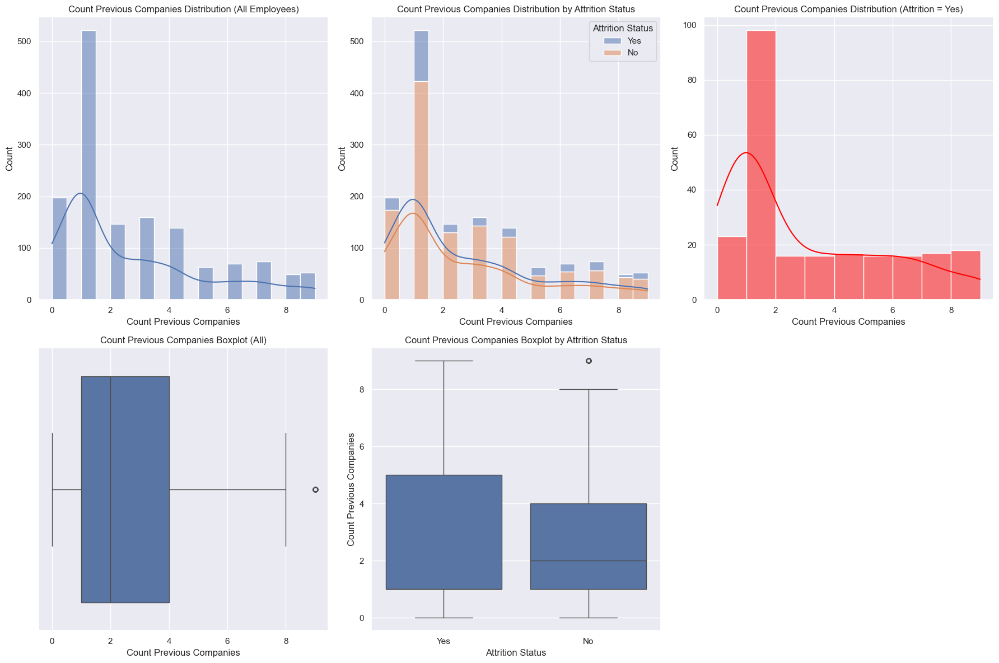

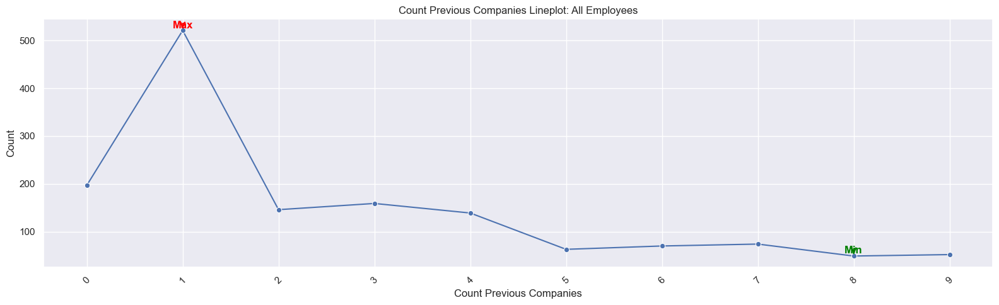

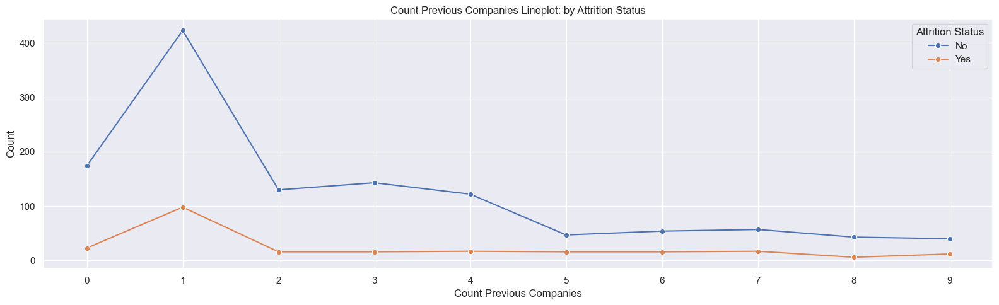

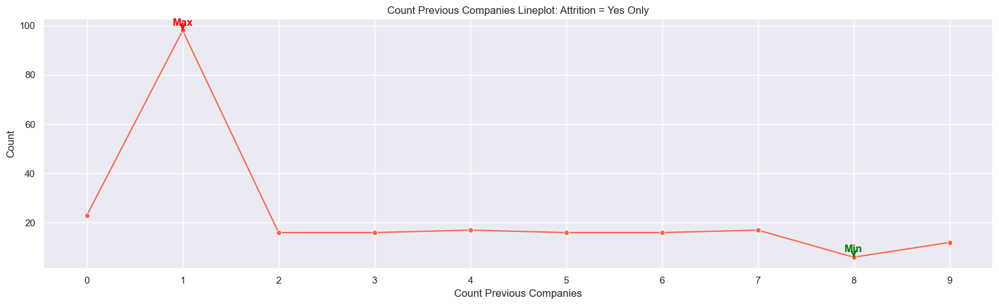


📊 Visualizing numerical column: Salary Hike (%)


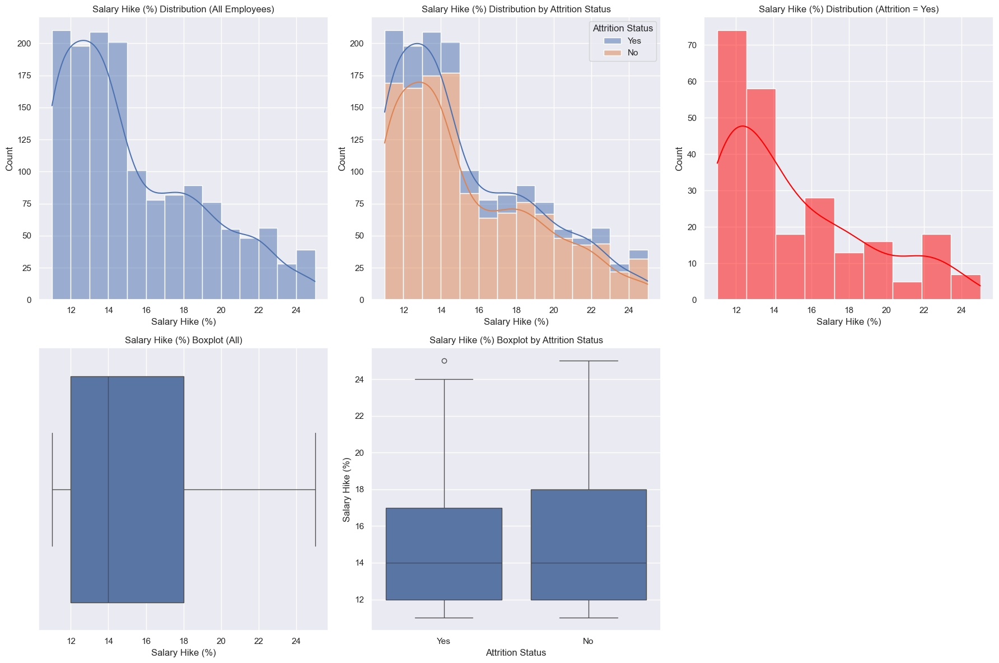

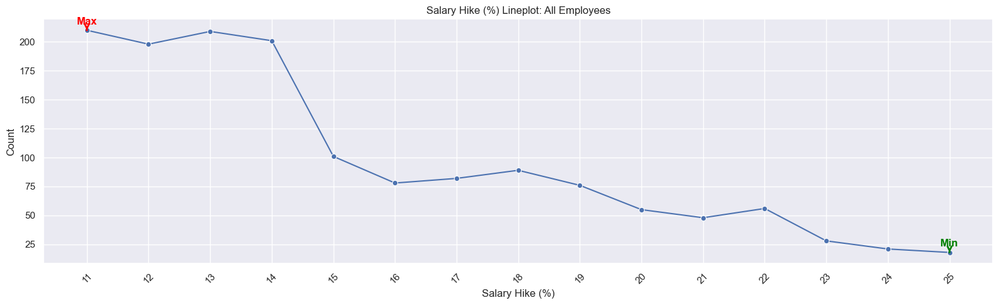

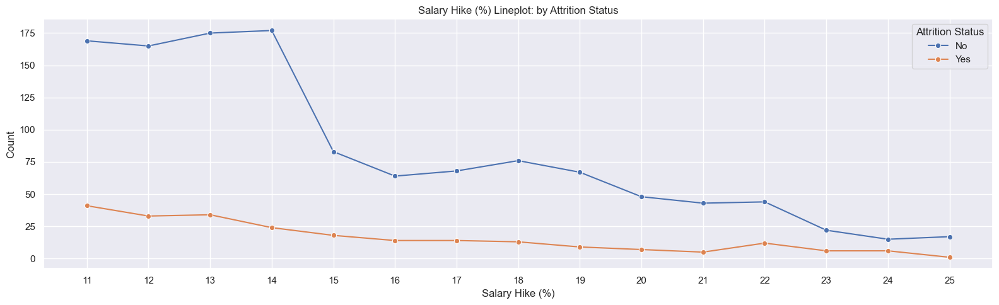

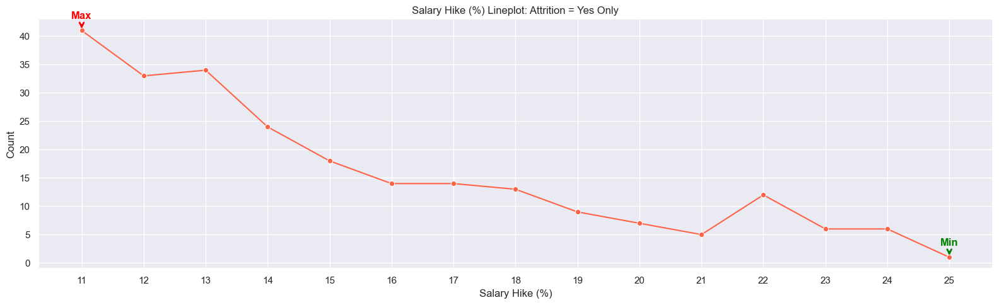


📊 Visualizing numerical column: Total Working Years


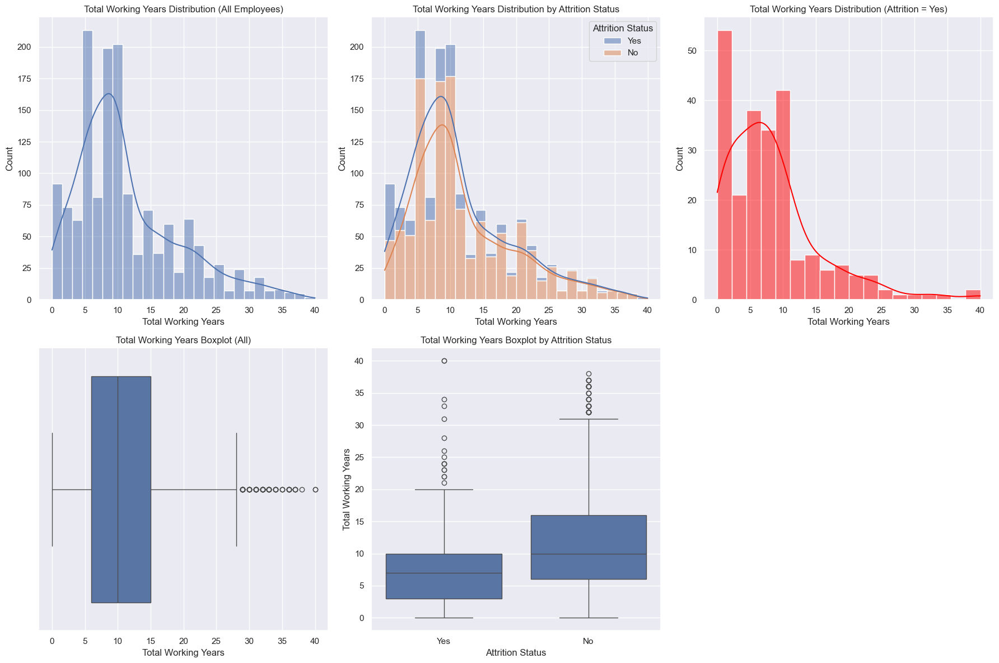

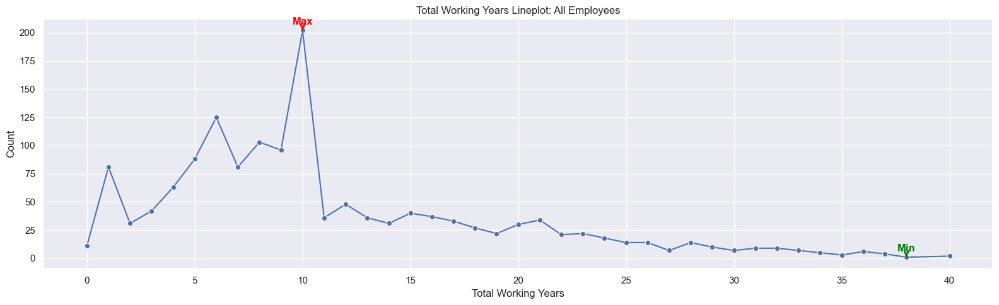

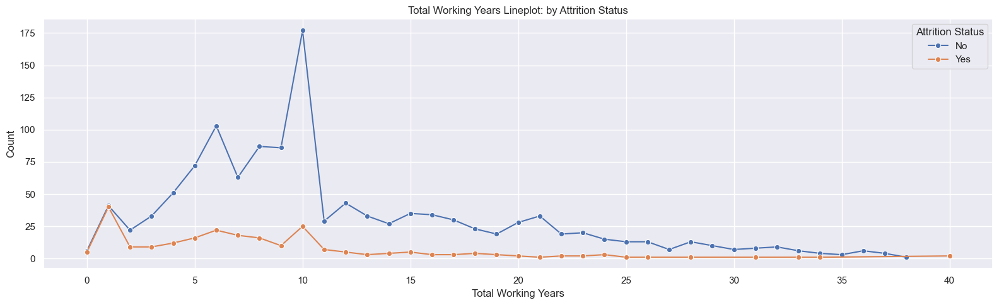

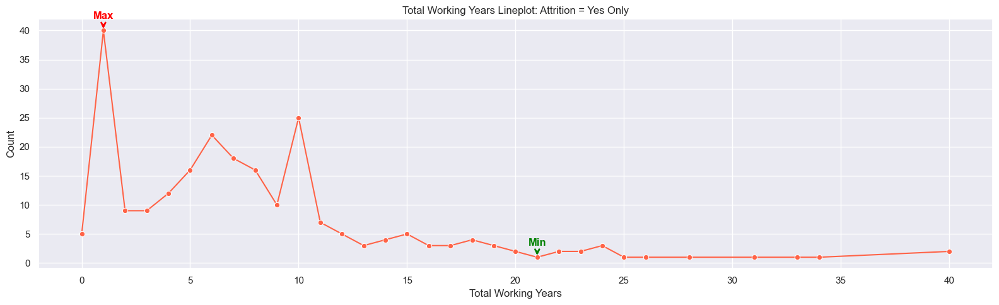


📊 Visualizing numerical column: Training Times Last Year


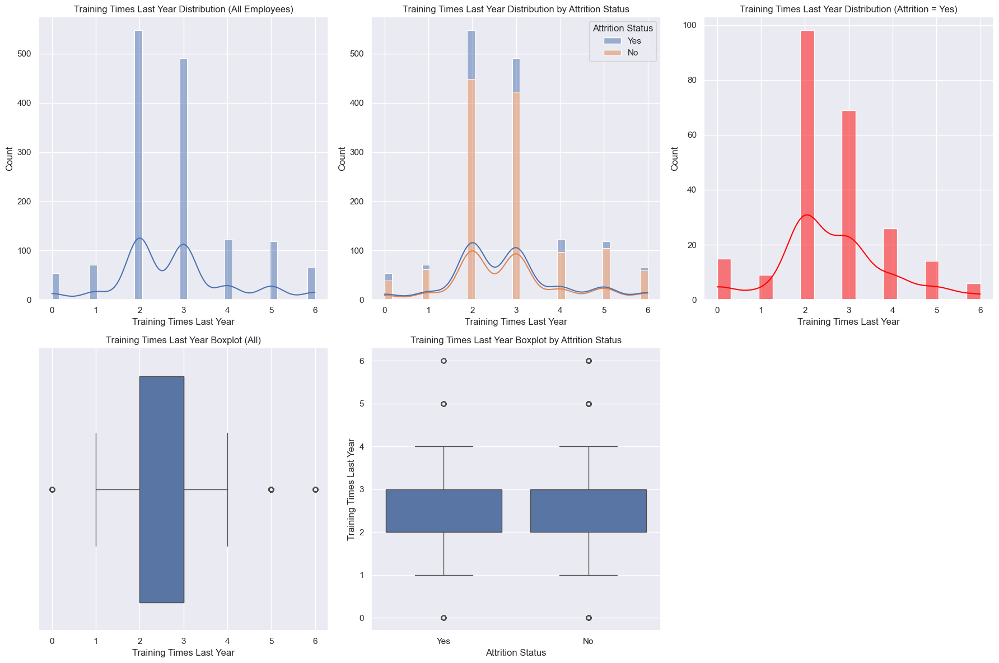

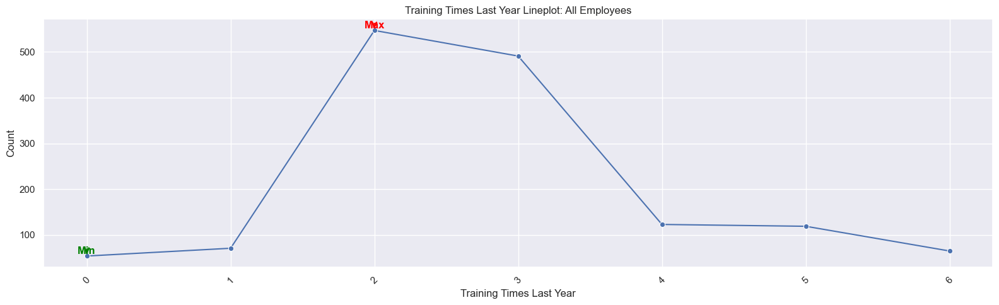

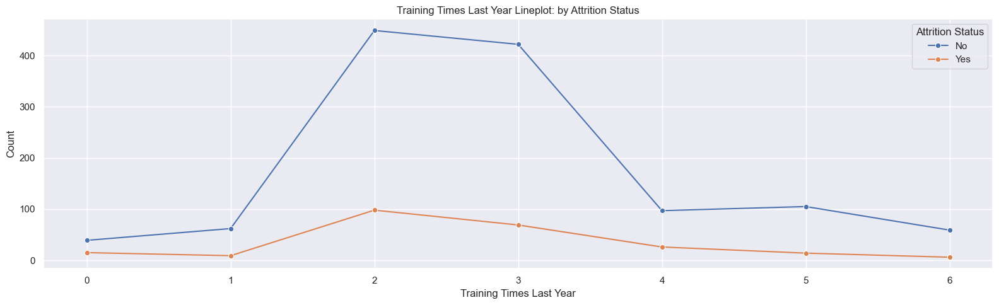

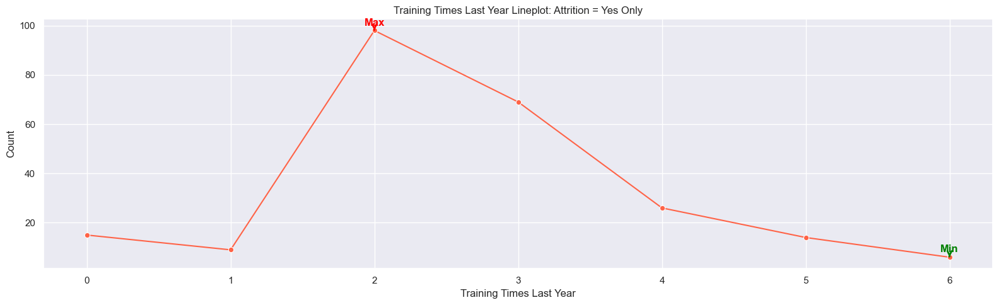


📊 Visualizing numerical column: Years at Company


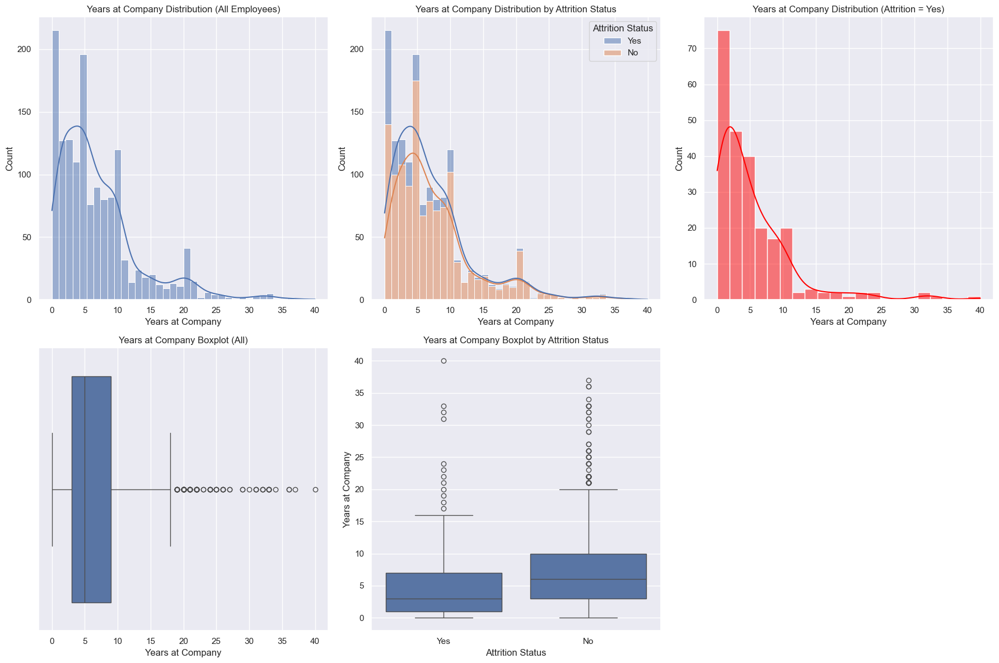

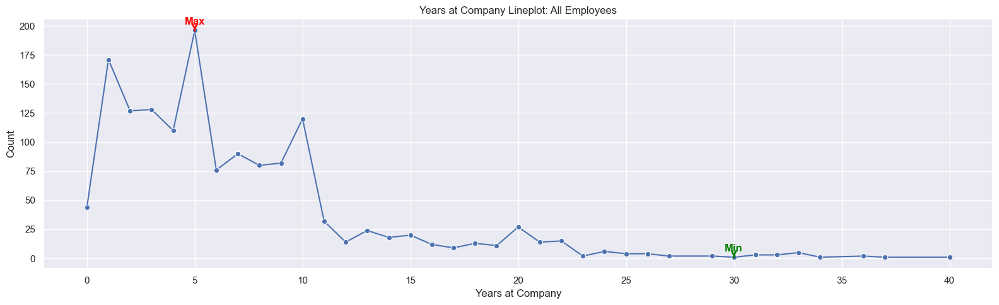

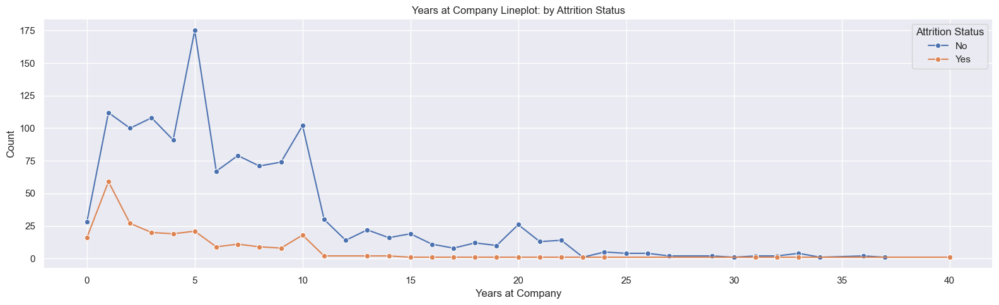

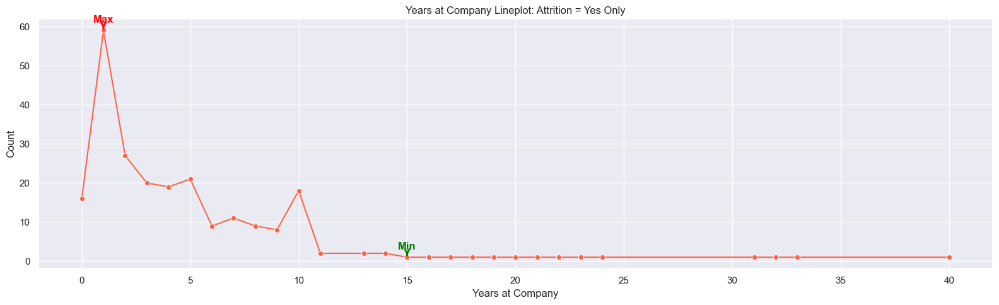


📊 Visualizing numerical column: Years in Current Role


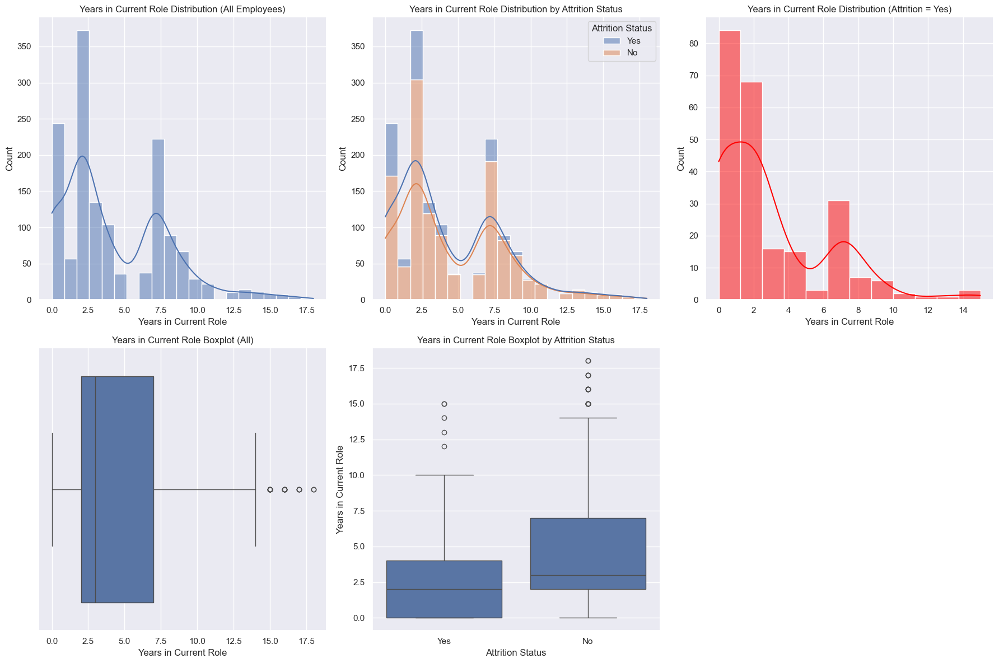

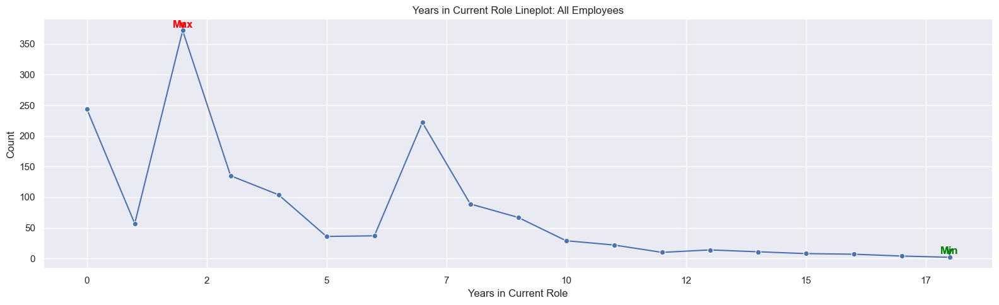

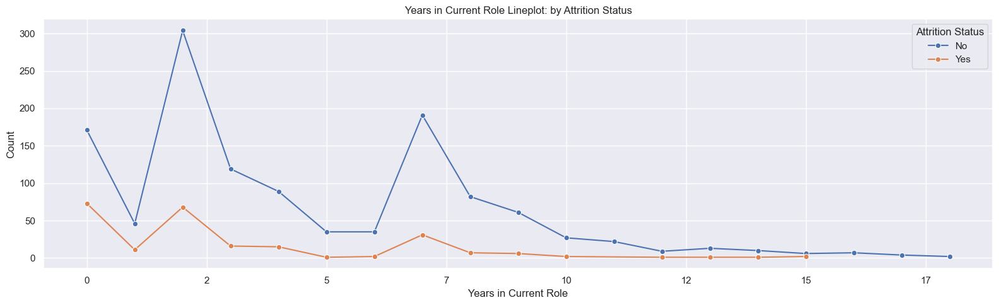

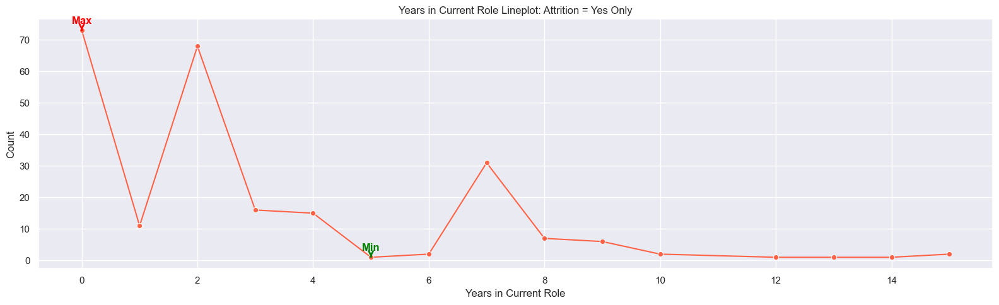


📊 Visualizing numerical column: Years Since Last Promotion


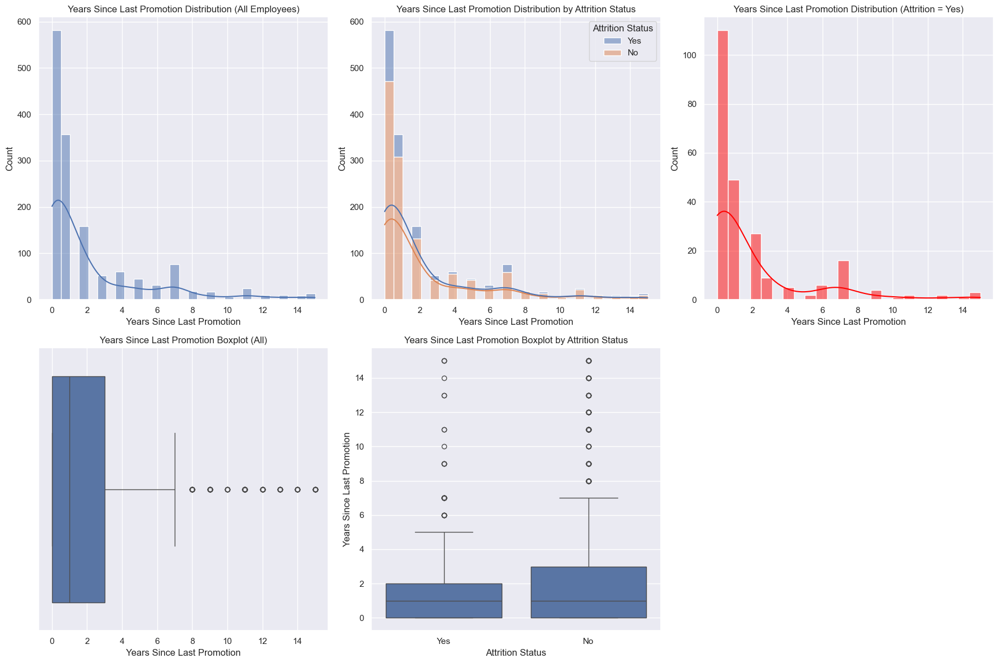

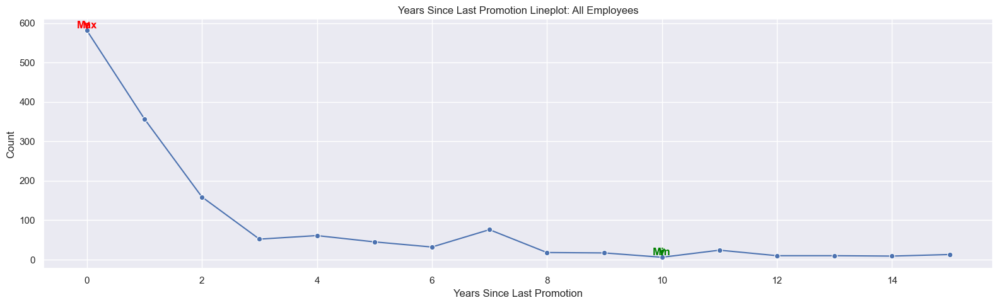

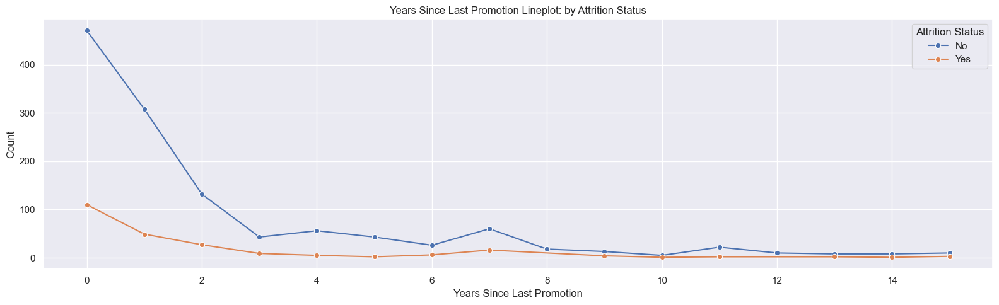

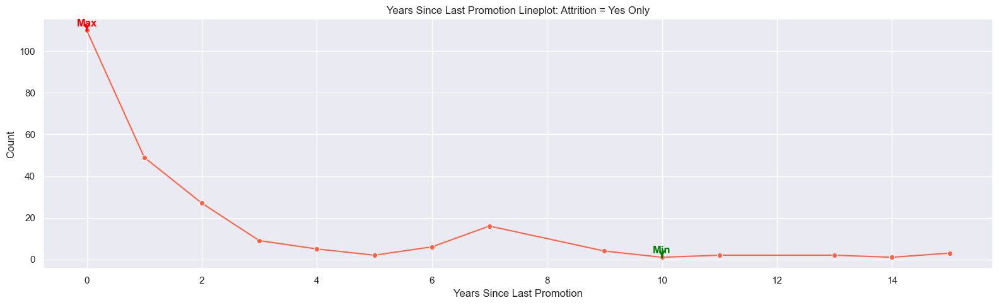


📊 Visualizing numerical column: Years with Current Manager


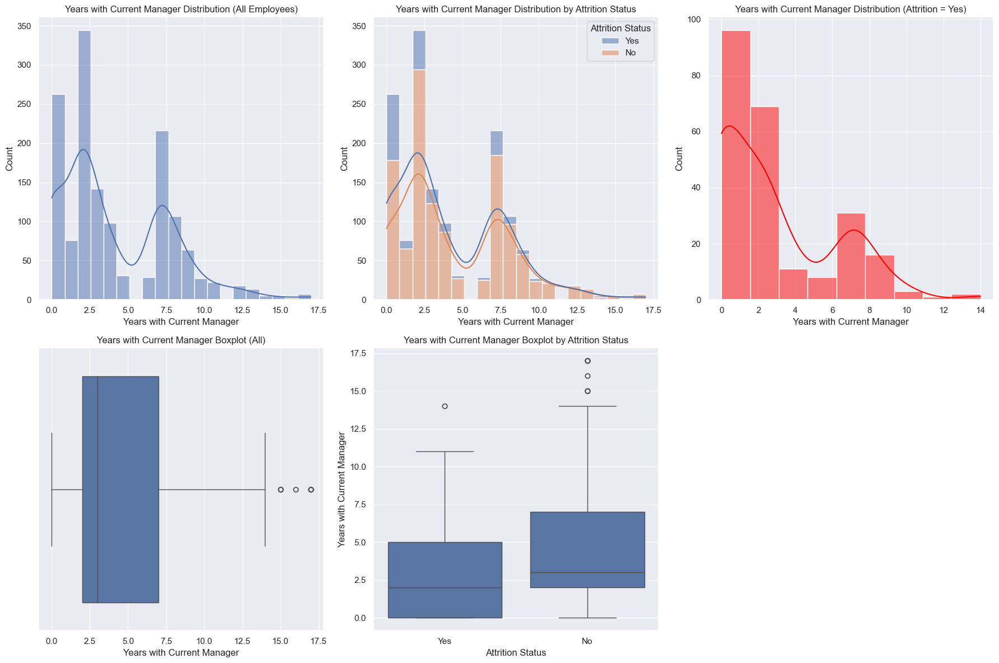

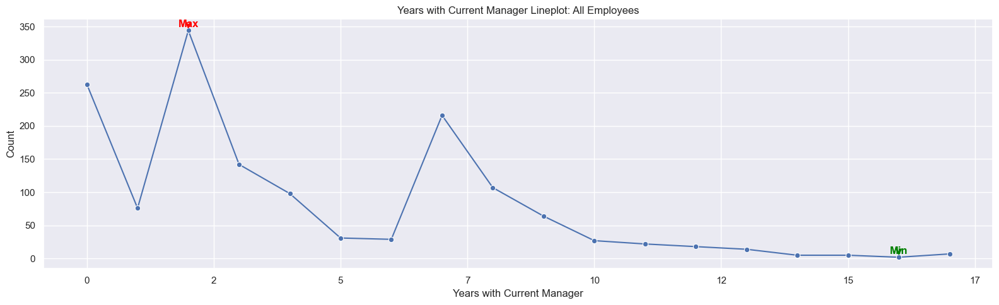

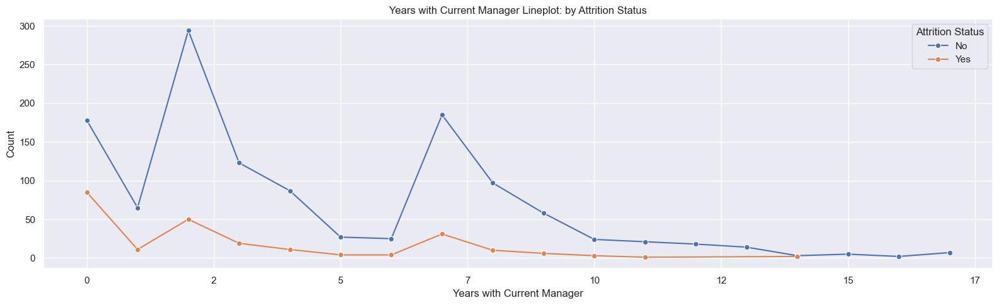

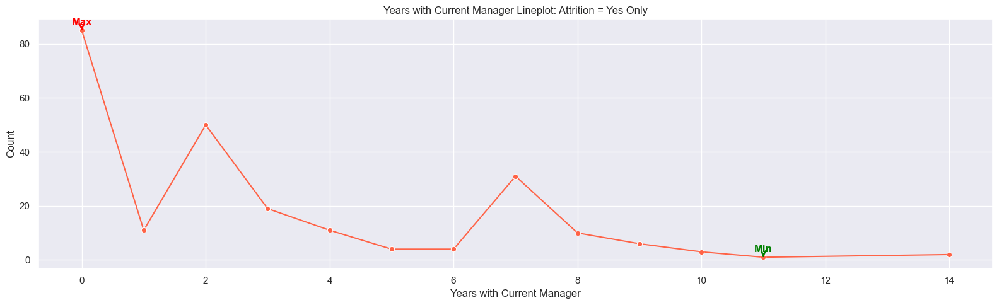

In [42]:
# Numerical visualizations
for col in numerical_cols:
    print(f"\n📊 Visualizing numerical column: {col}")
    plot_numerical_features(df, col)


📊 Visualizing: Business Travel Frequency


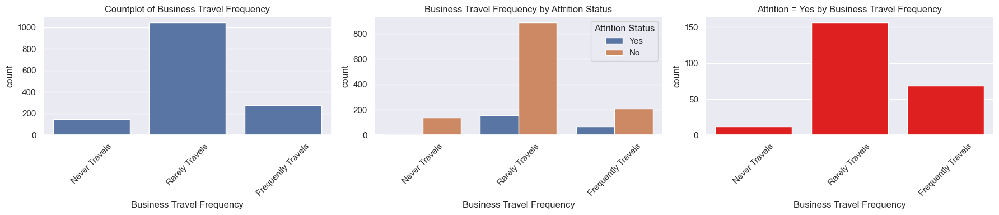

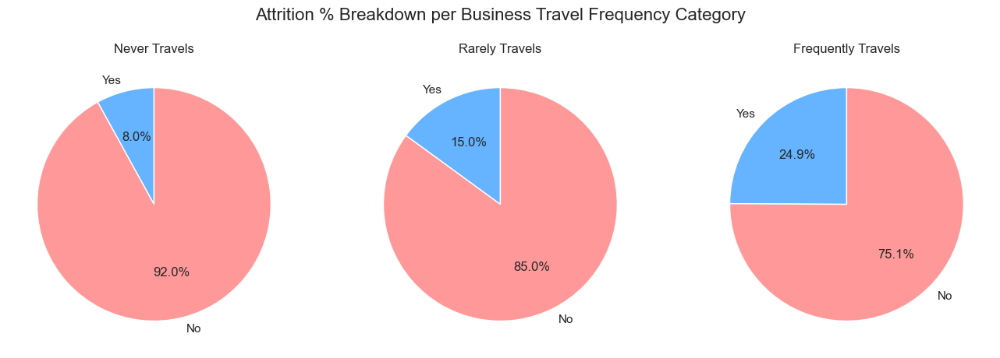

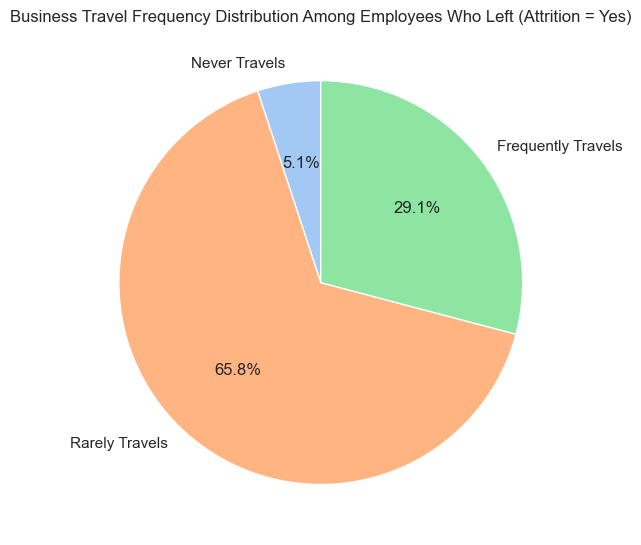


📊 Visualizing: Department


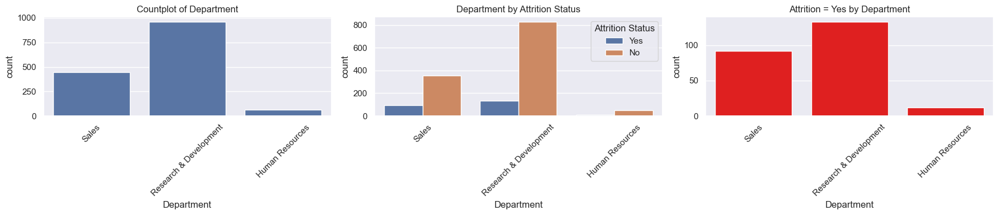

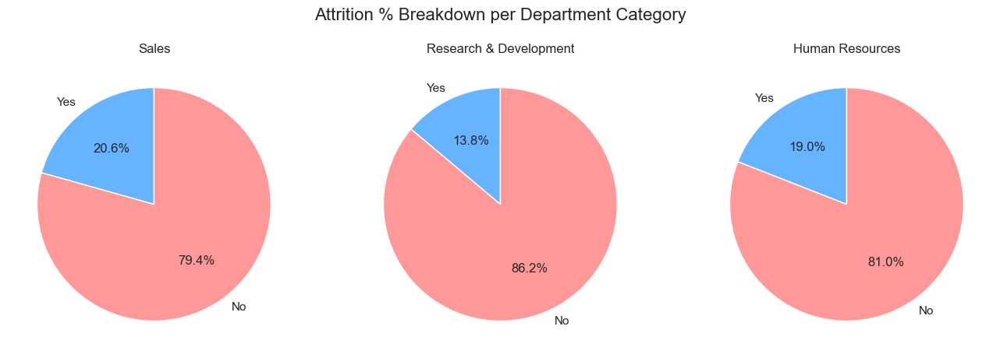

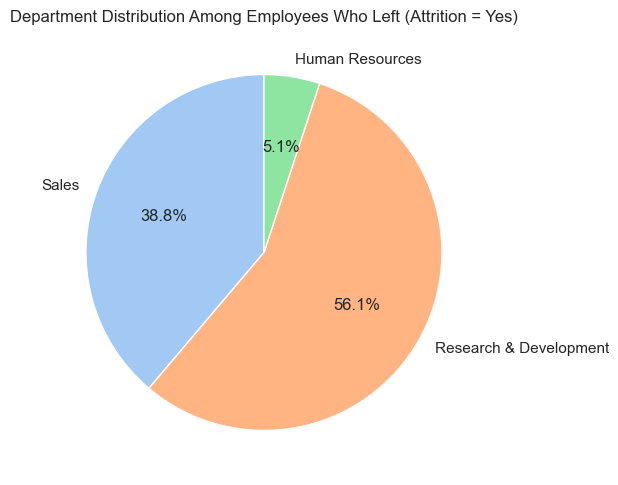


📊 Visualizing: Education Level


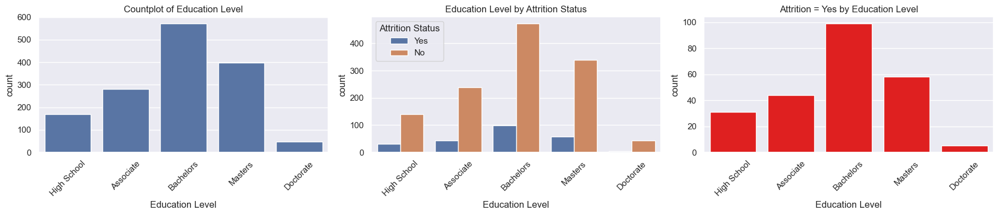

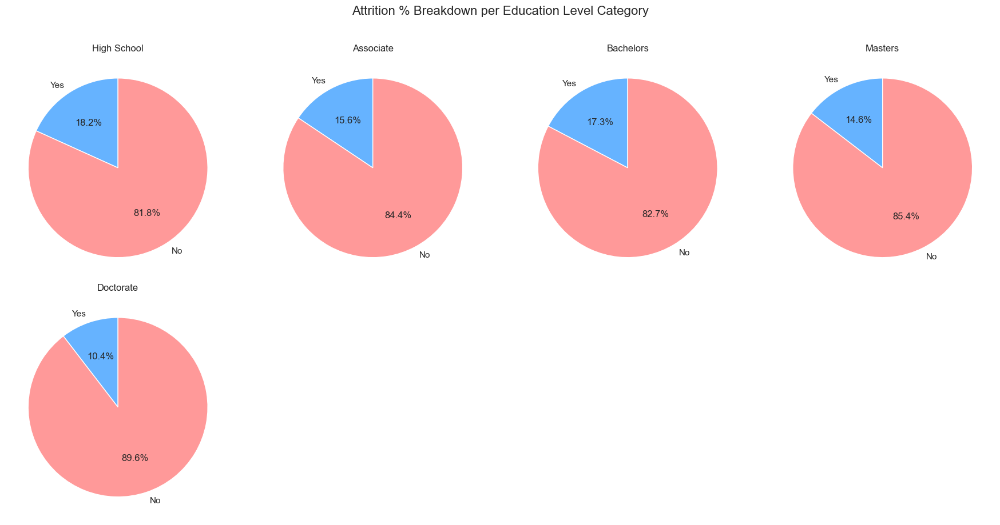

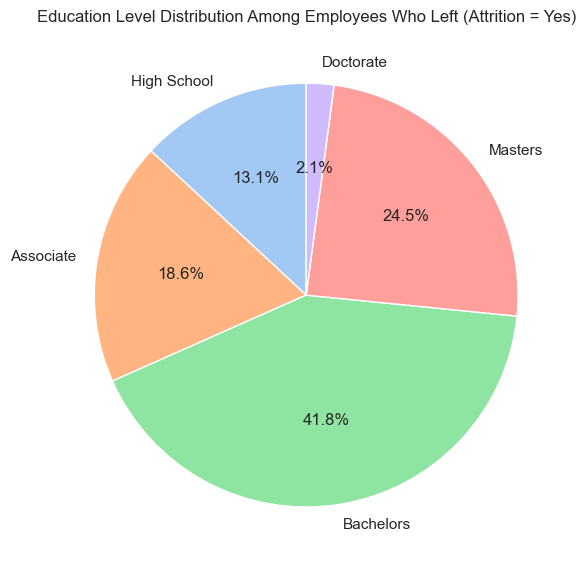


📊 Visualizing: Education Field


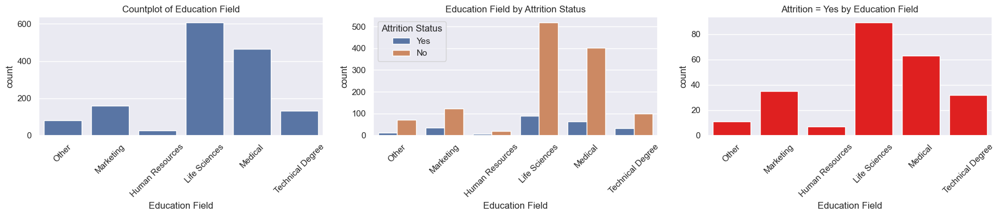

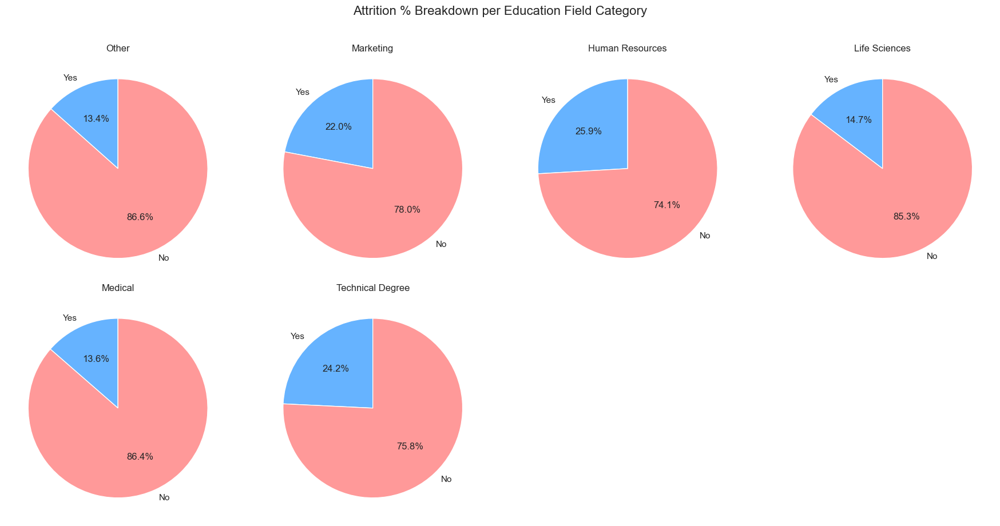

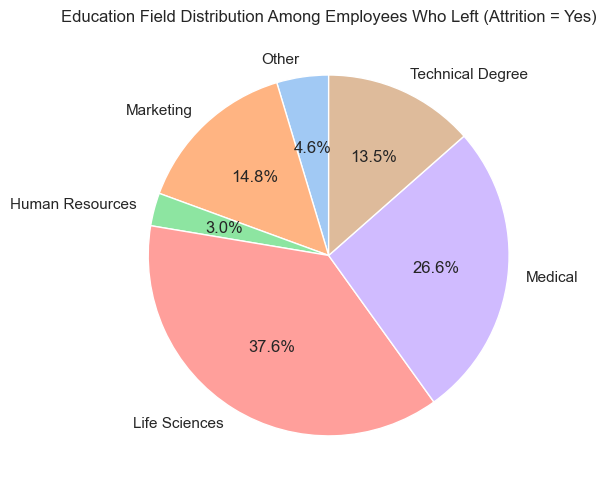


📊 Visualizing: Environment Satisfaction


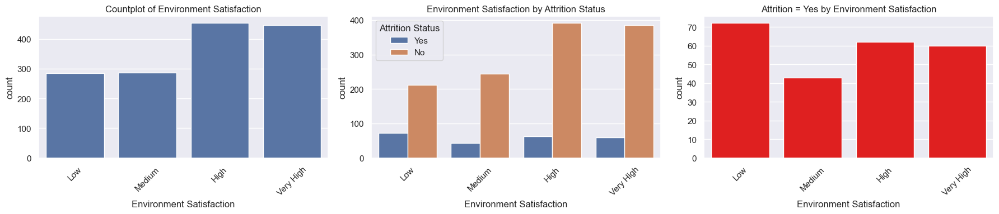

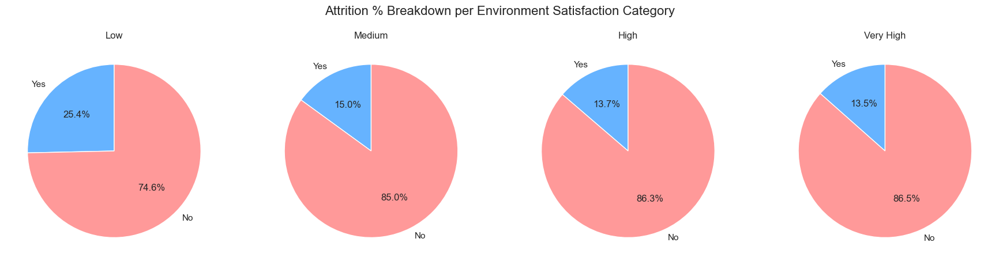

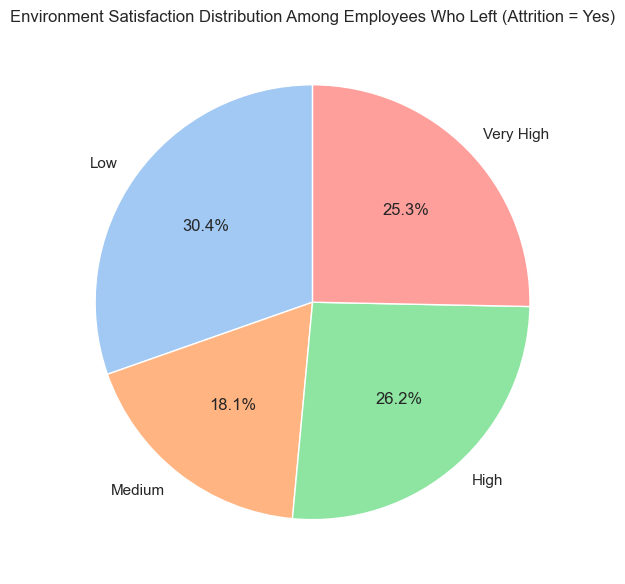


📊 Visualizing: Gender


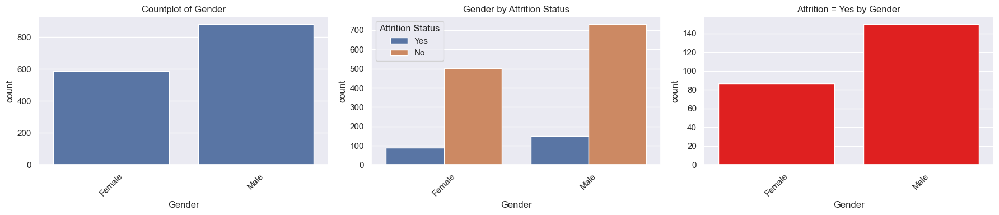

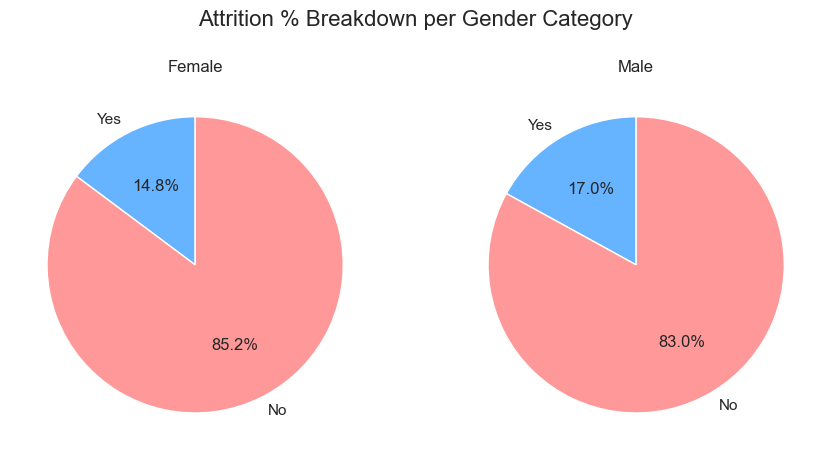

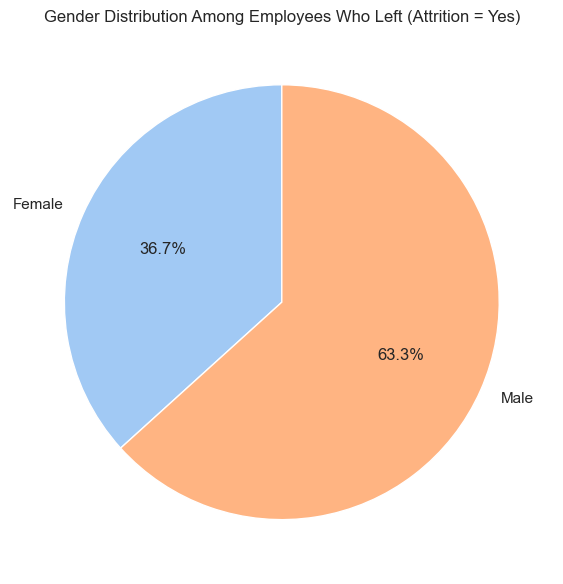


📊 Visualizing: Job Involvement


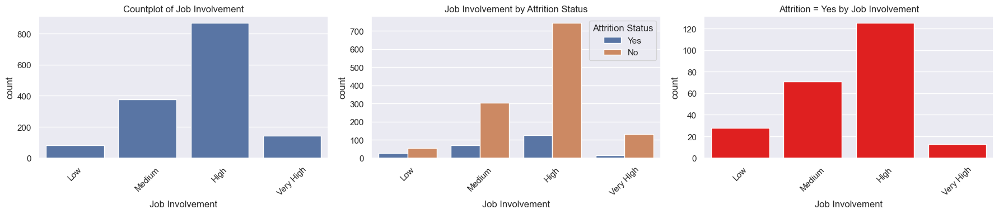

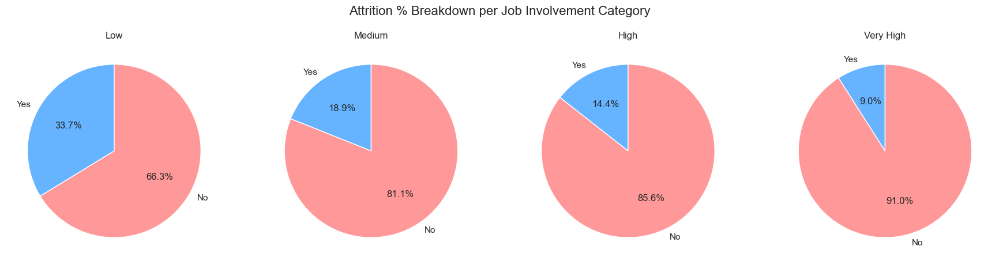

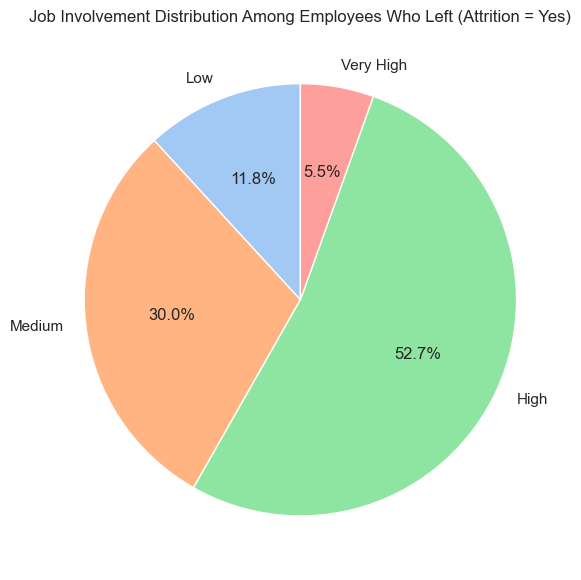


📊 Visualizing: Job Level


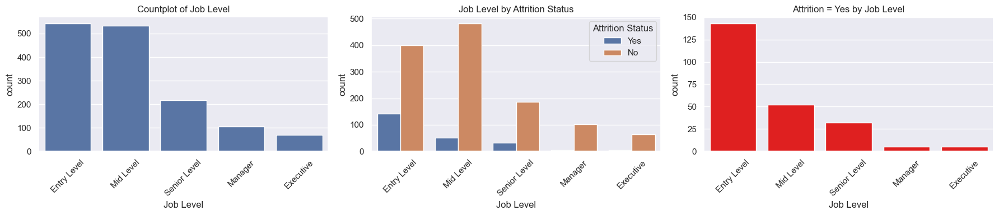

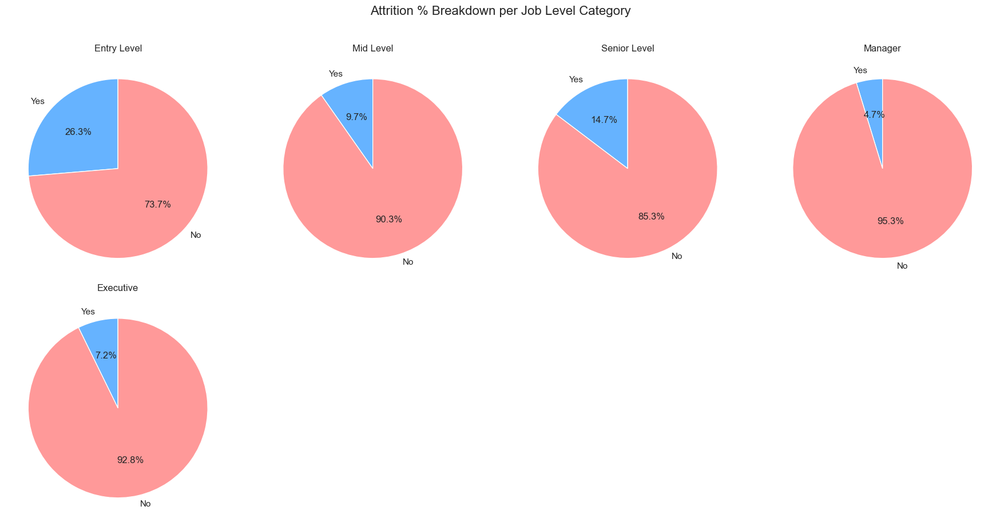

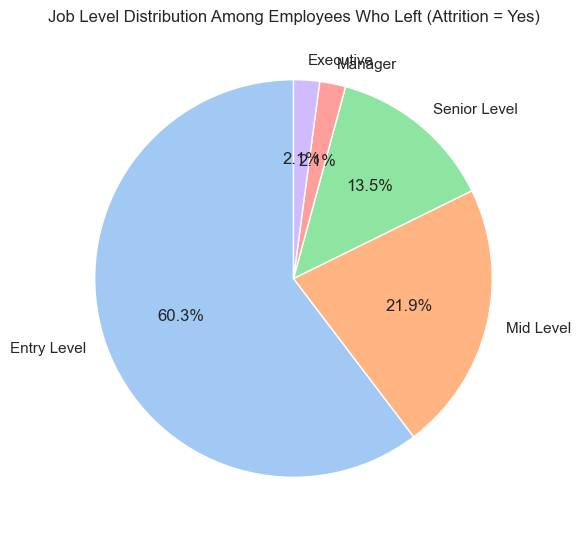


📊 Visualizing: Job Role


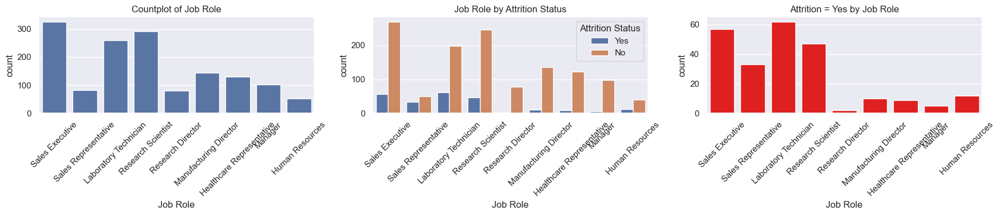

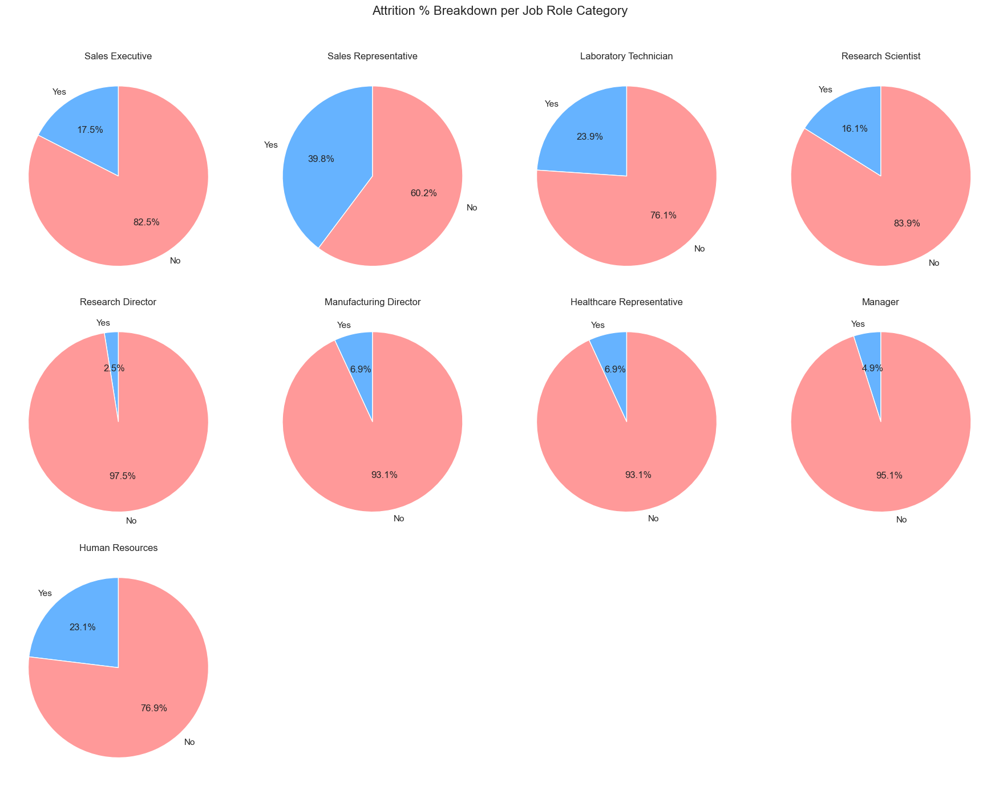

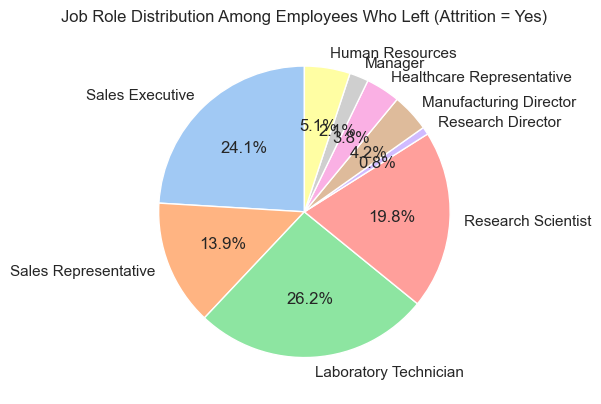


📊 Visualizing: Job Satisfaction


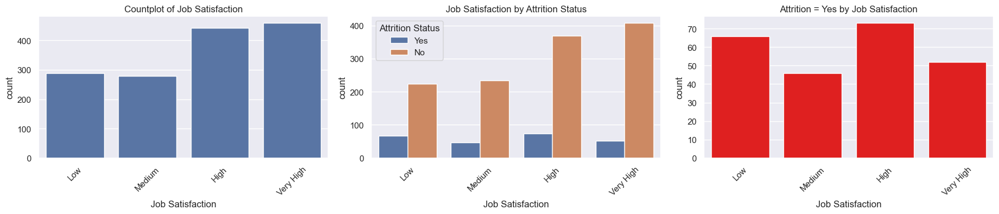

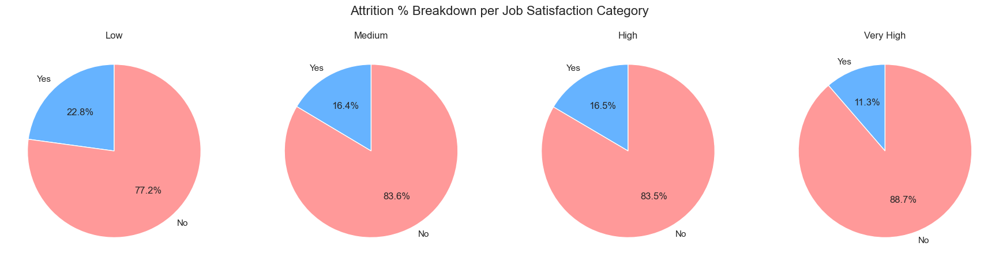

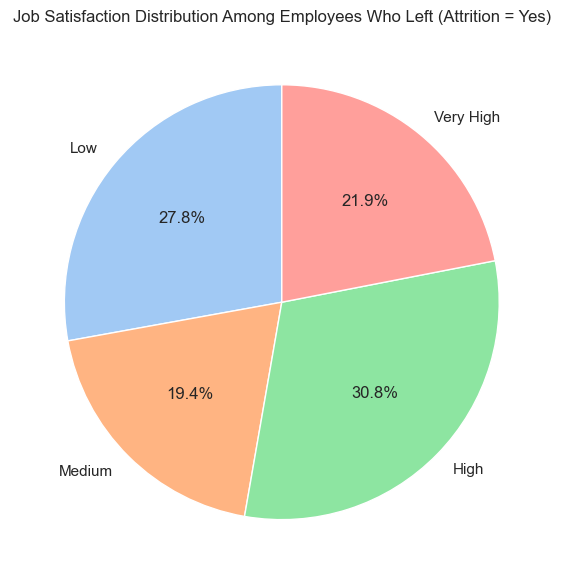


📊 Visualizing: Marital Status


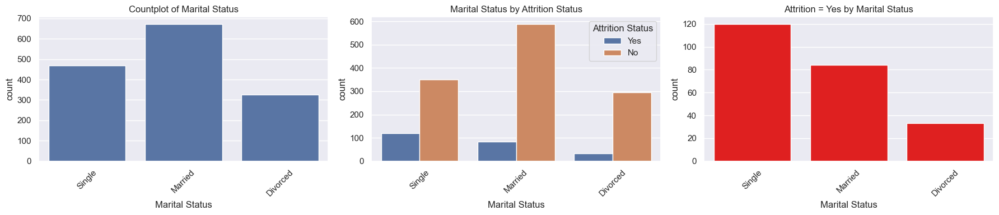

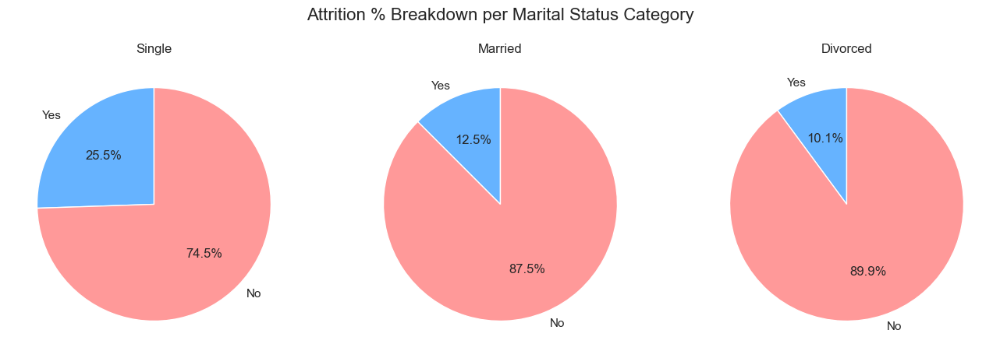

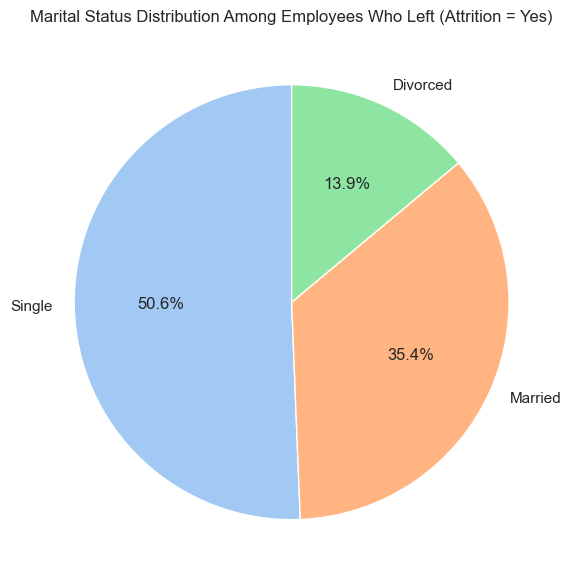


📊 Visualizing: Works Overtime


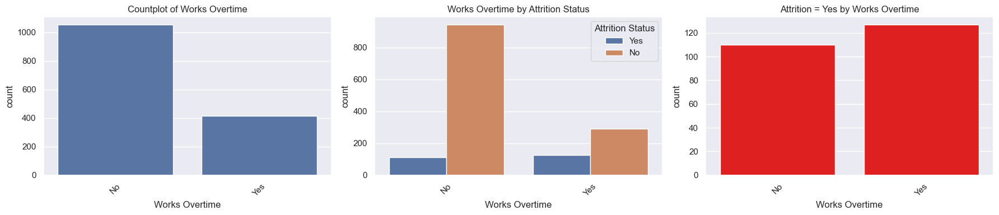

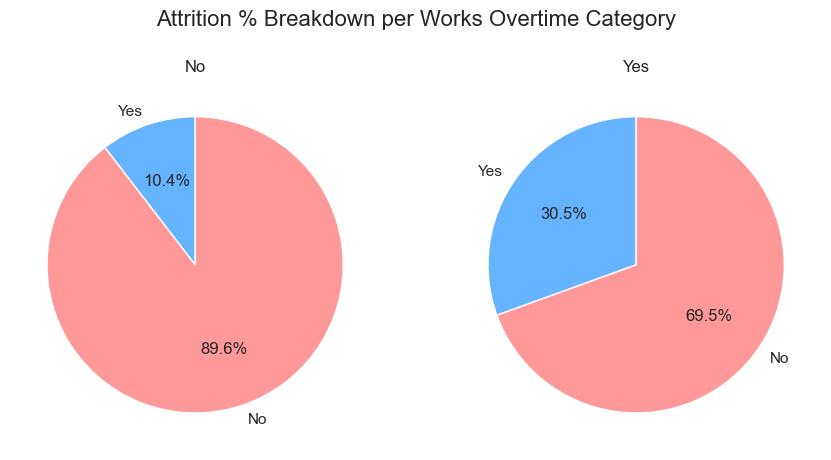

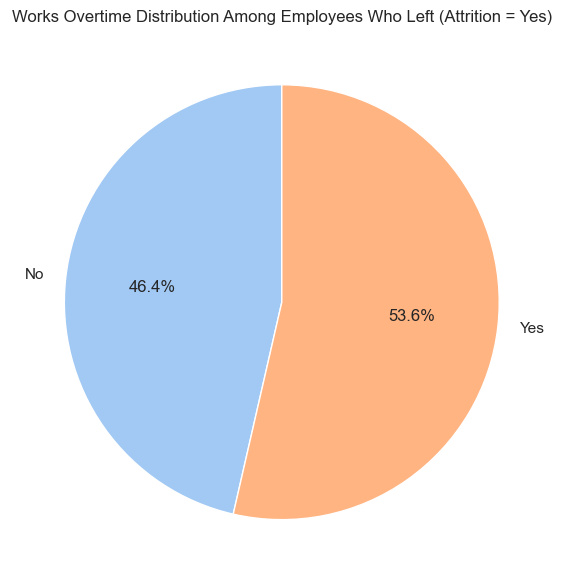


📊 Visualizing: Relationship Satisfaction


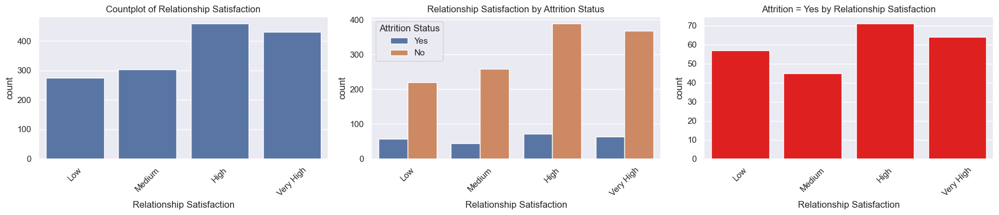

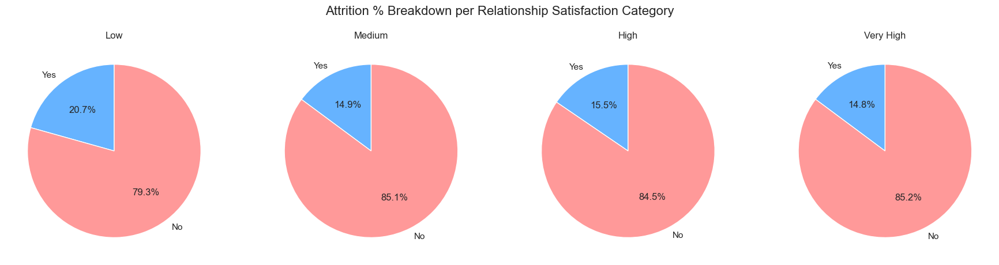

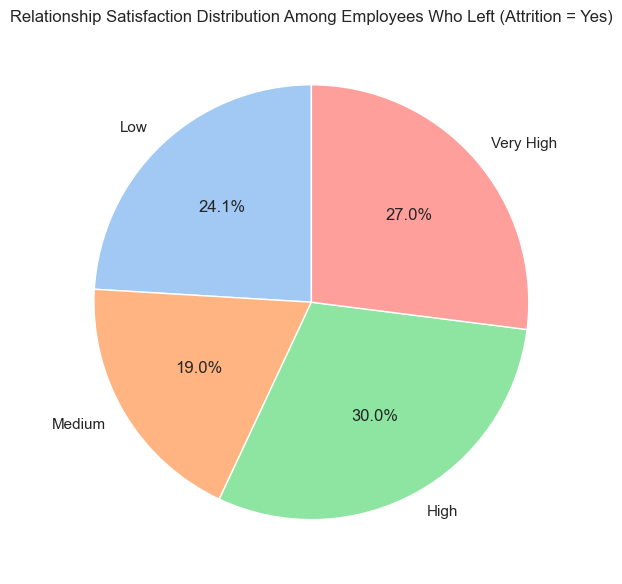


📊 Visualizing: Stock Option Level


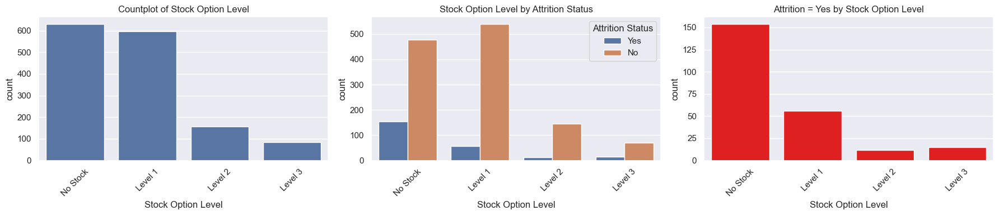

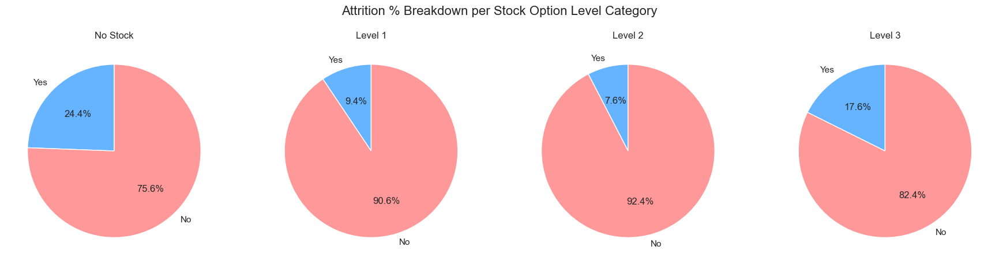

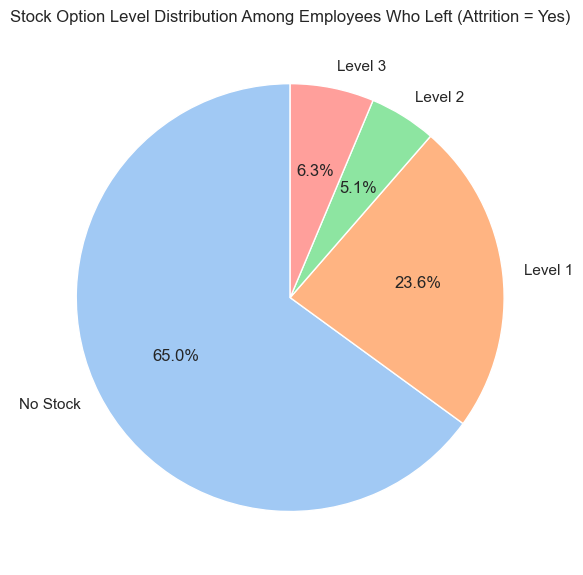


📊 Visualizing: Work-Life Balance


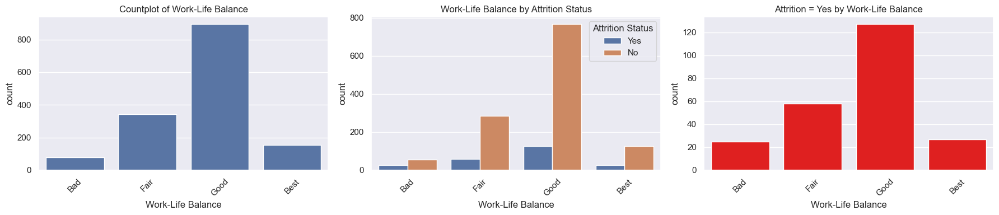

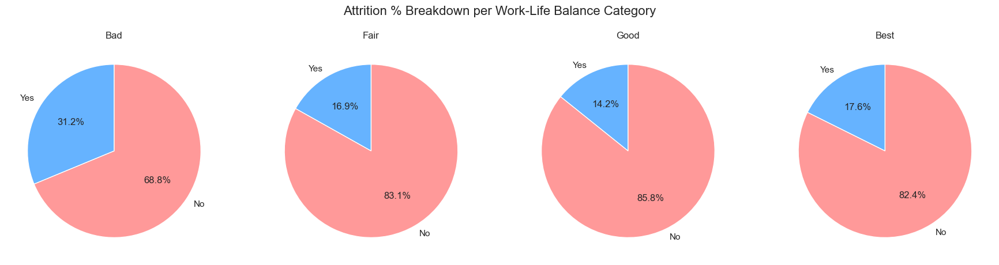

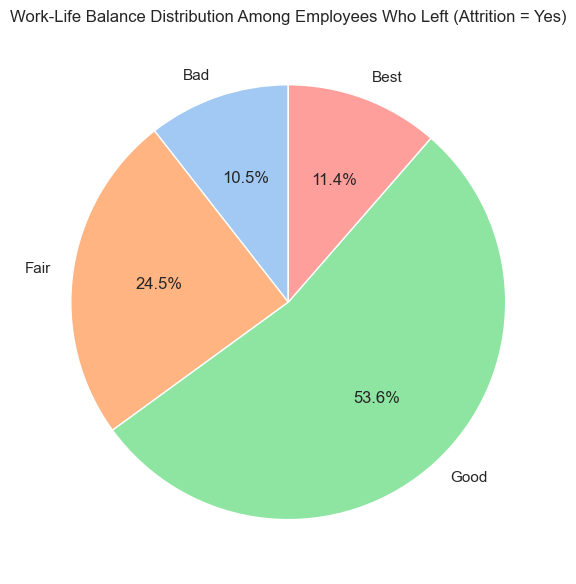


📊 Visualizing: Age Group


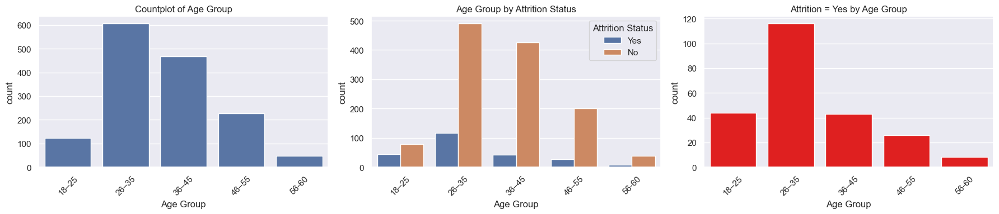

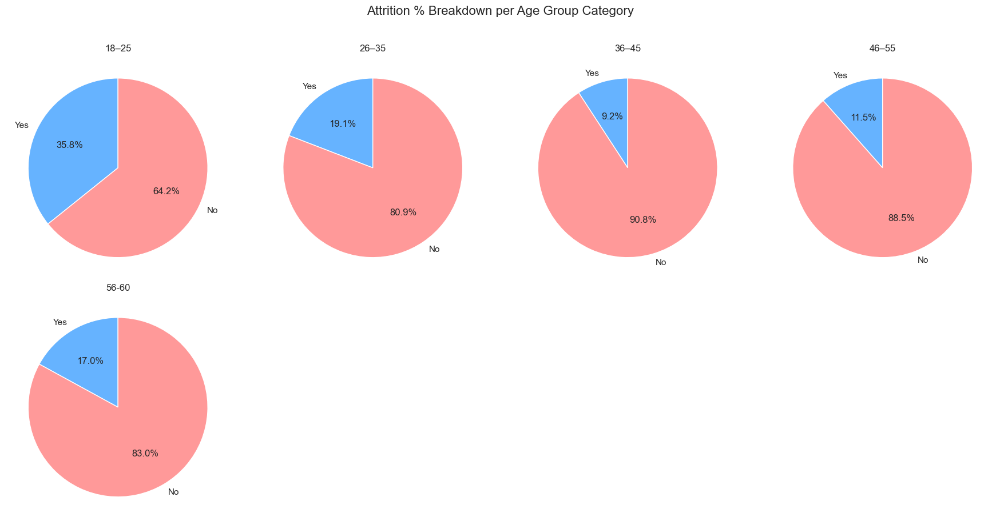

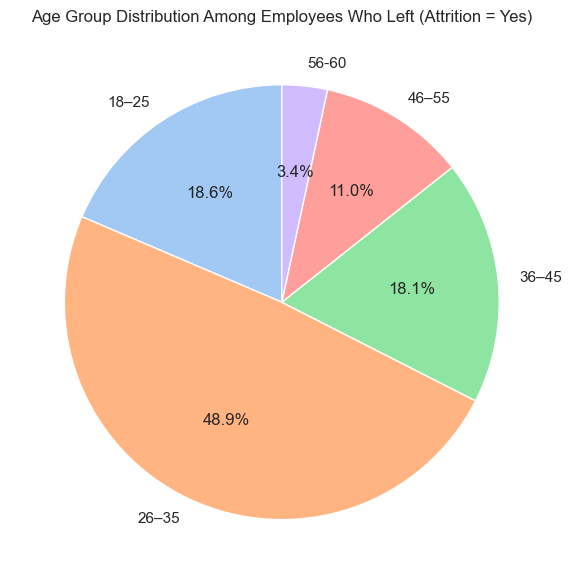


📊 Visualizing: Income Group


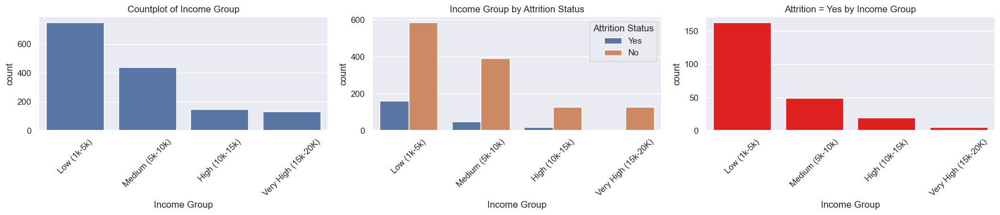

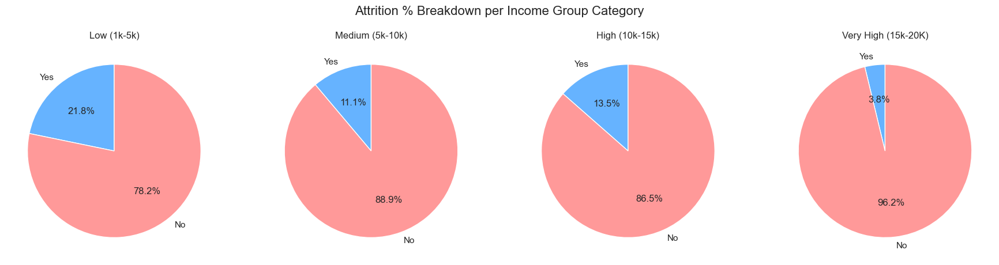

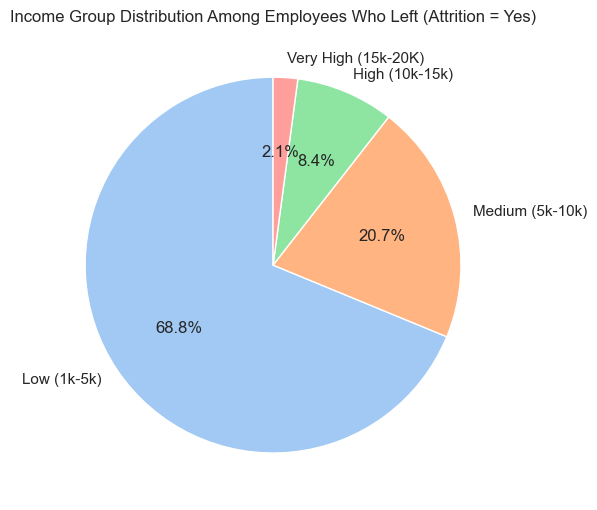


📊 Visualizing: Distance Group


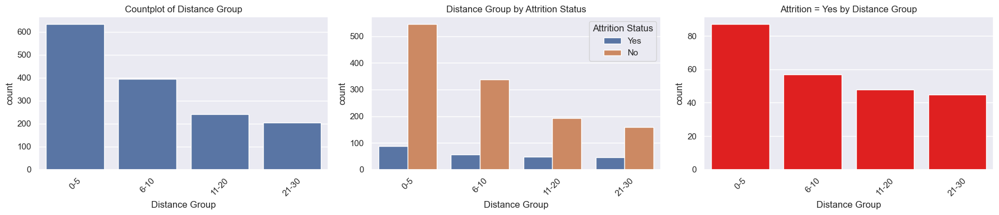

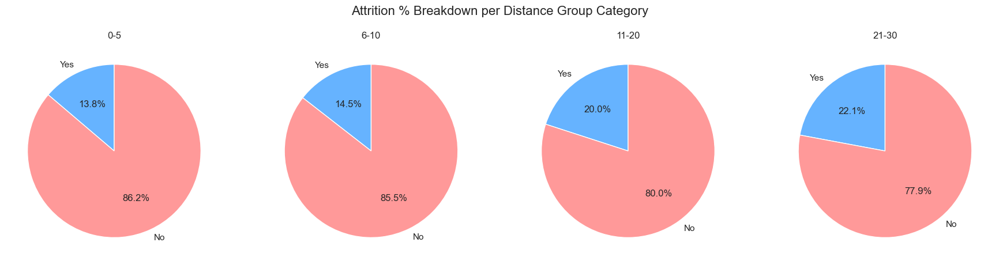

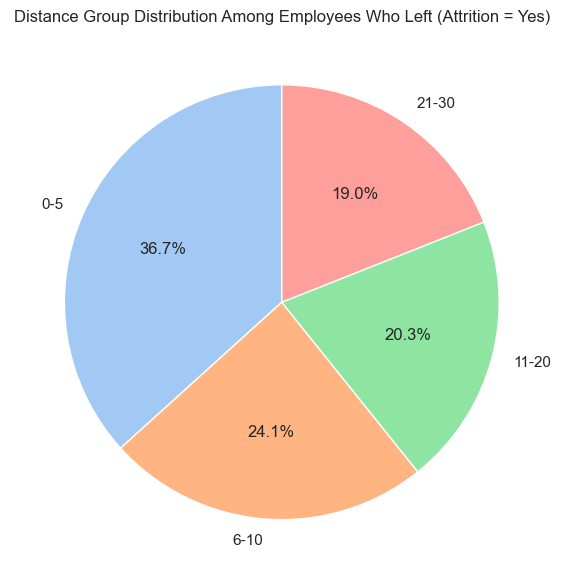


📊 Visualizing: Companies Worked Group


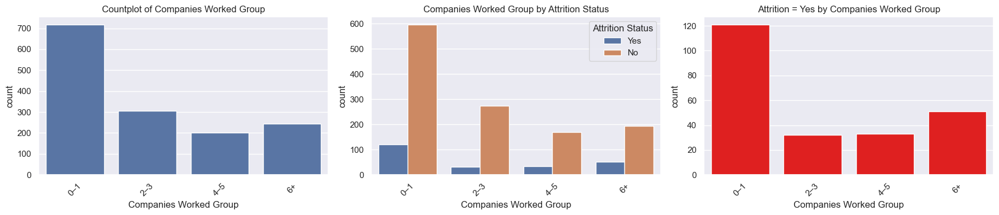

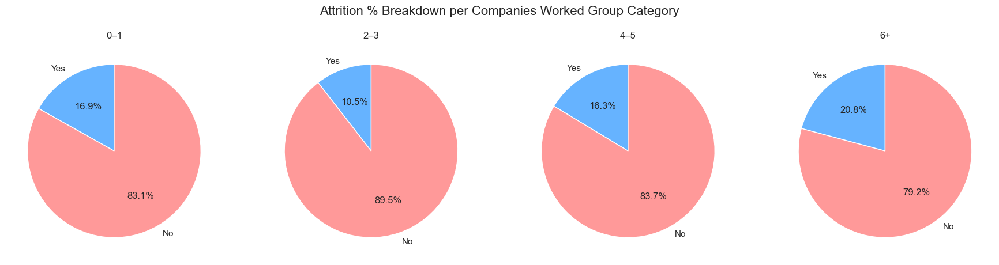

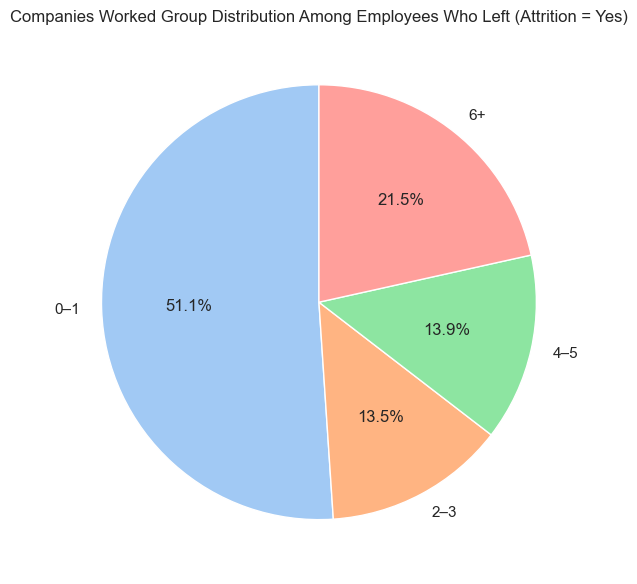


📊 Visualizing: Salary Hike Category


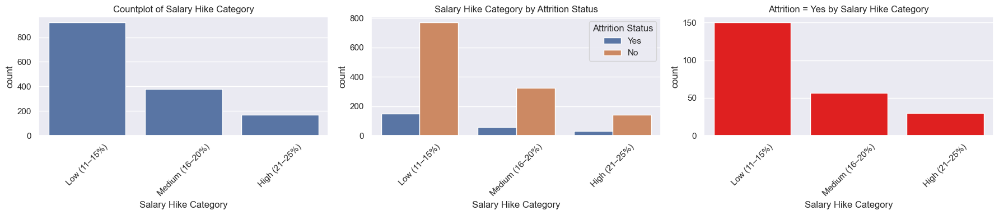

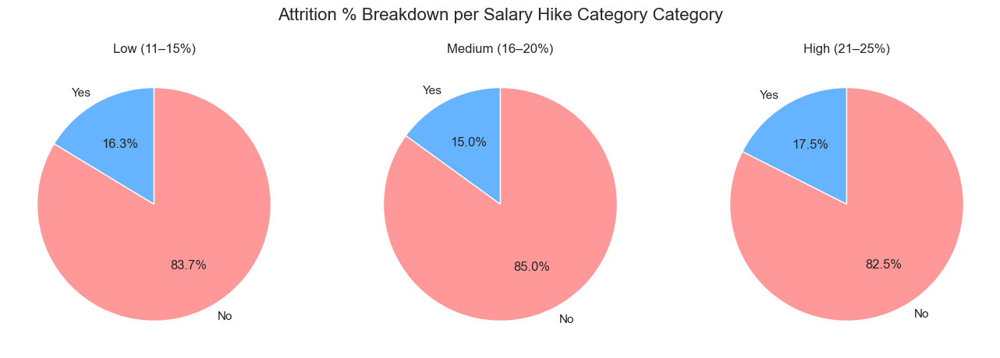

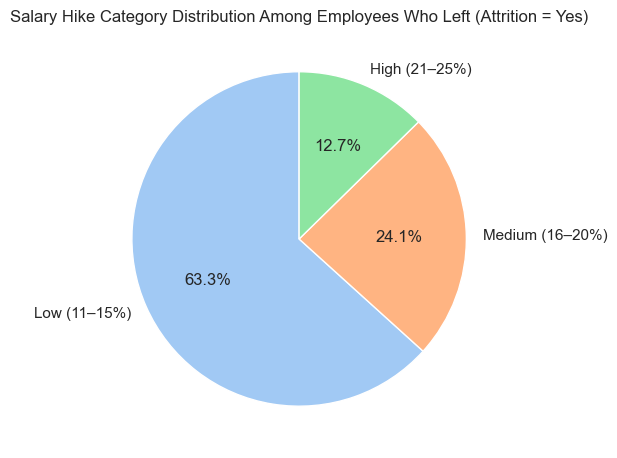


📊 Visualizing: Experience Group


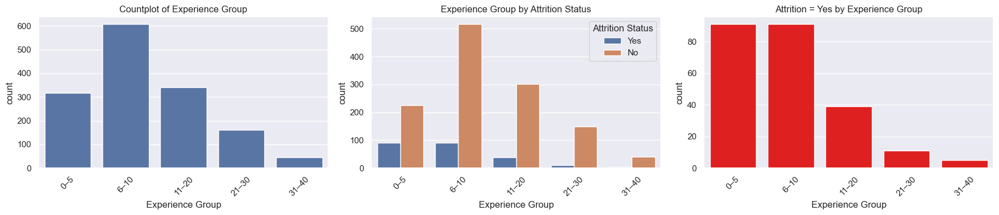

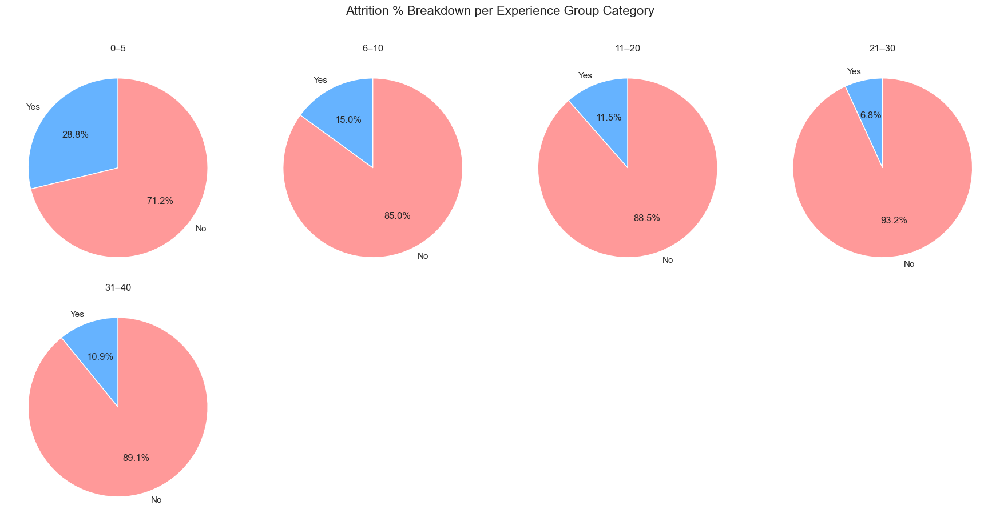

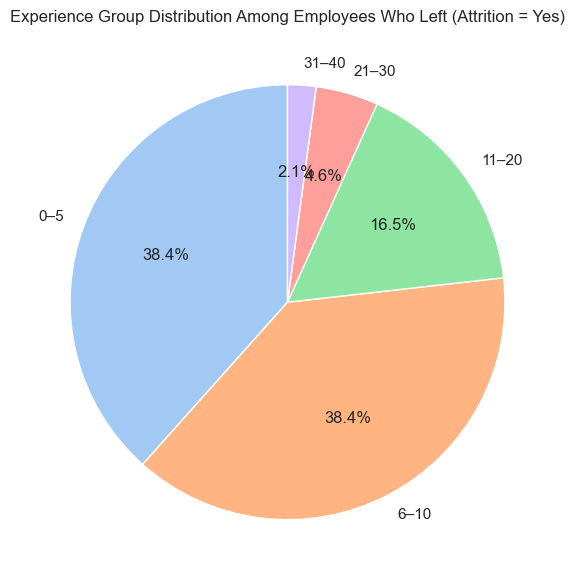


📊 Visualizing: Training Frequency


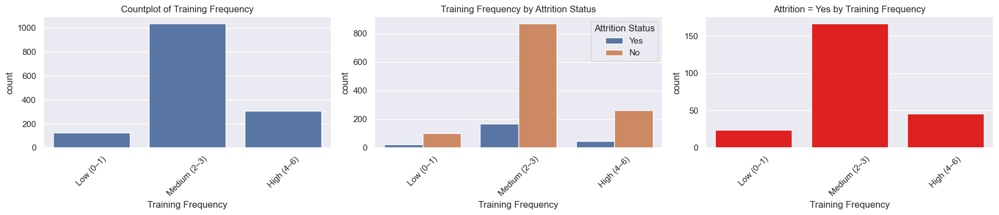

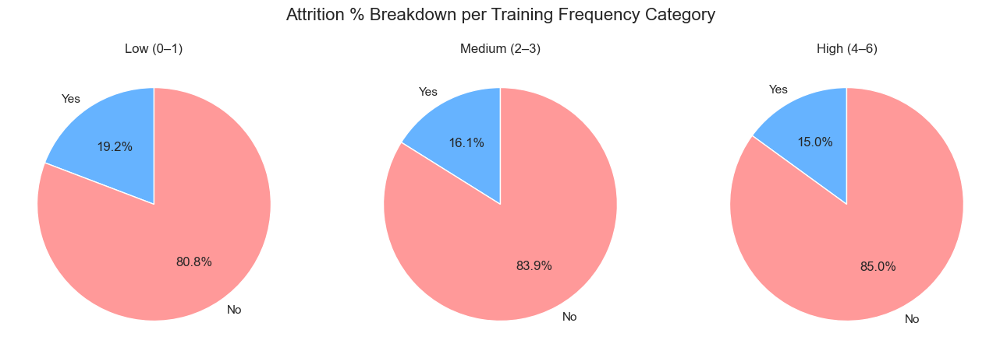

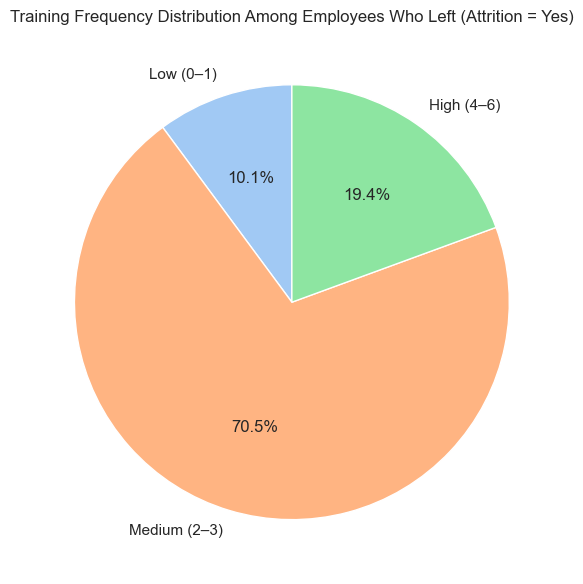


📊 Visualizing: Company Tenure Group


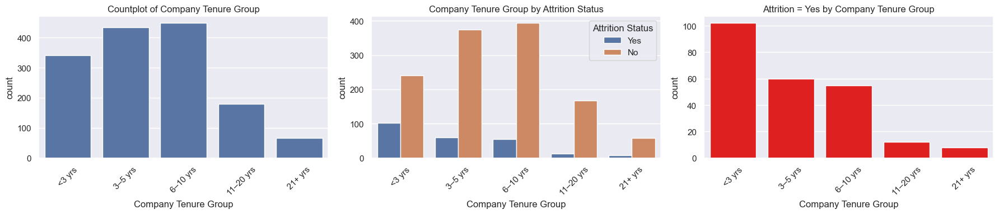

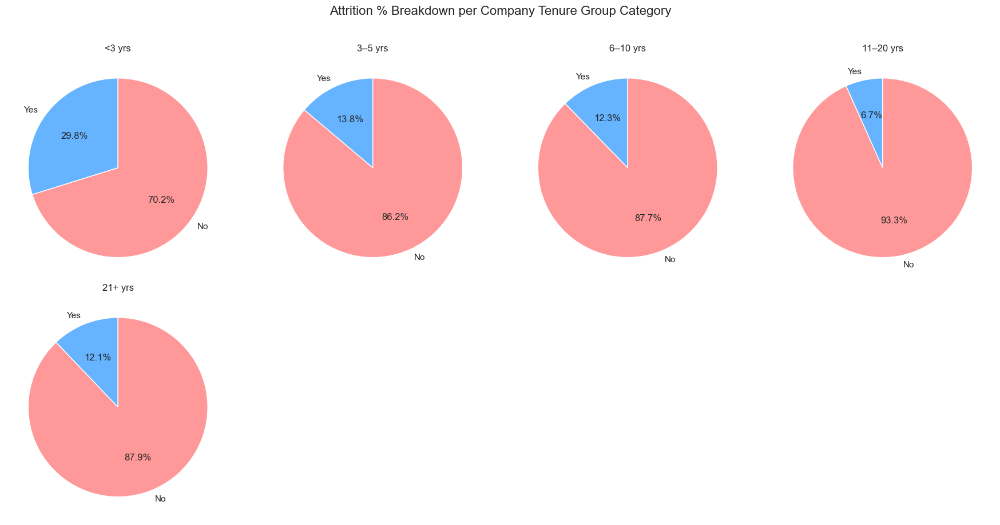

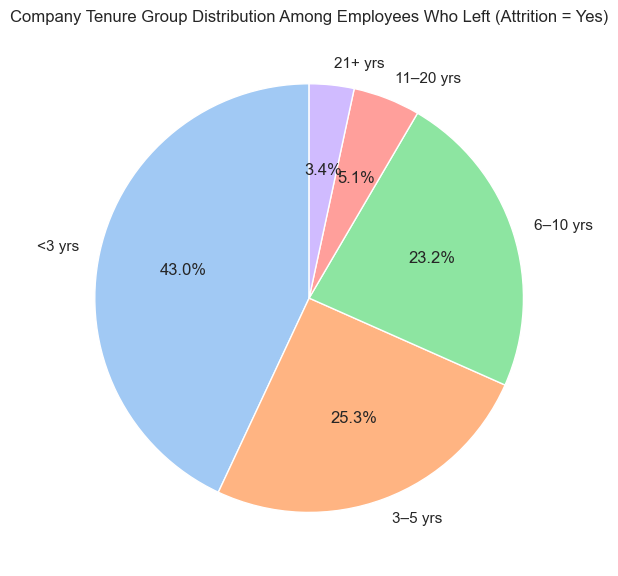


📊 Visualizing: Role Tenure Group


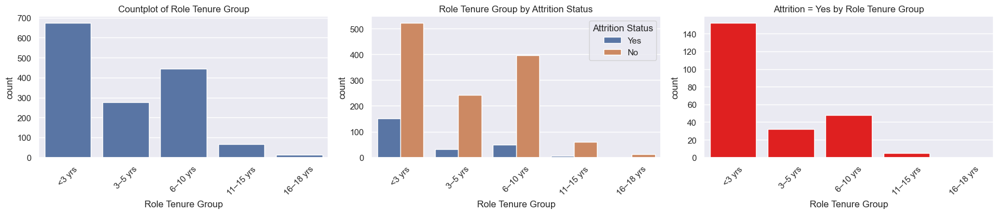

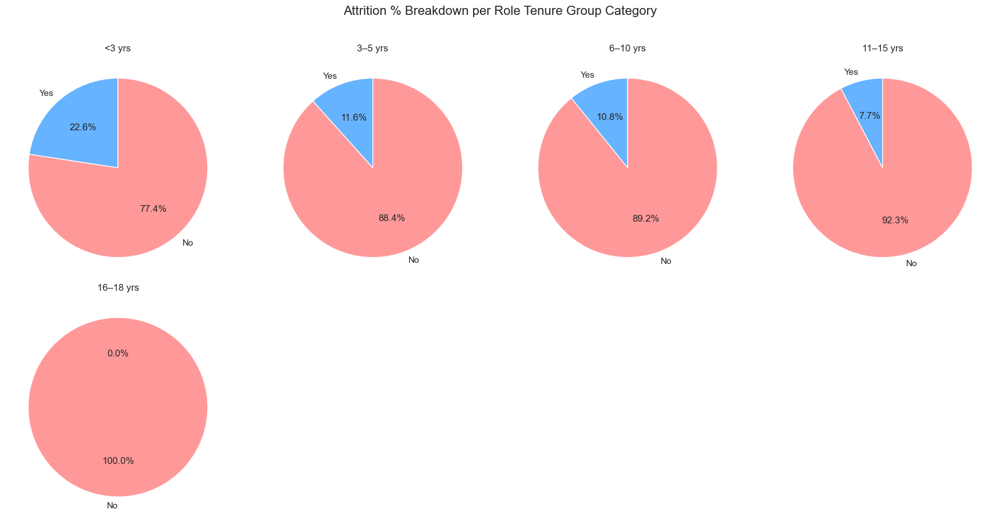

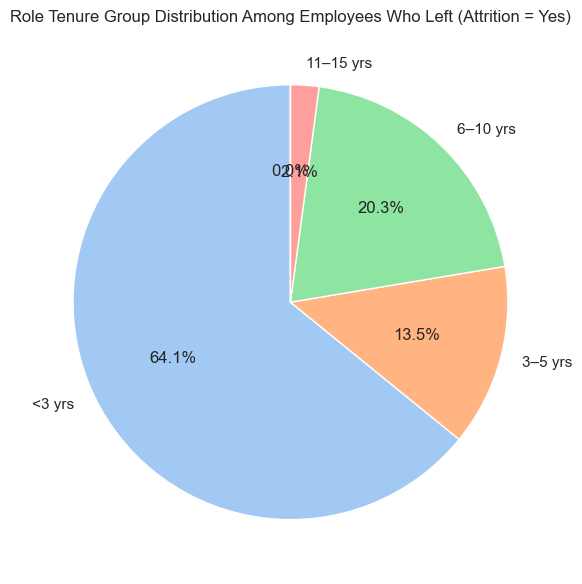


📊 Visualizing: Promotion Recency Group


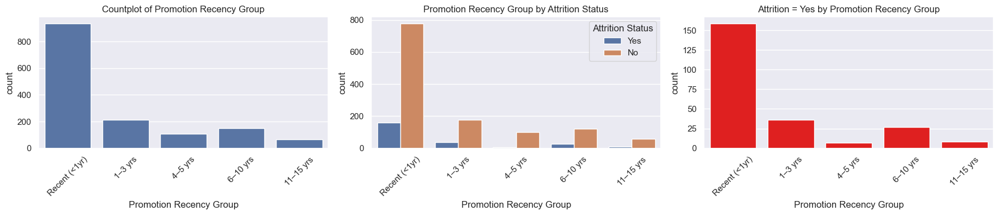

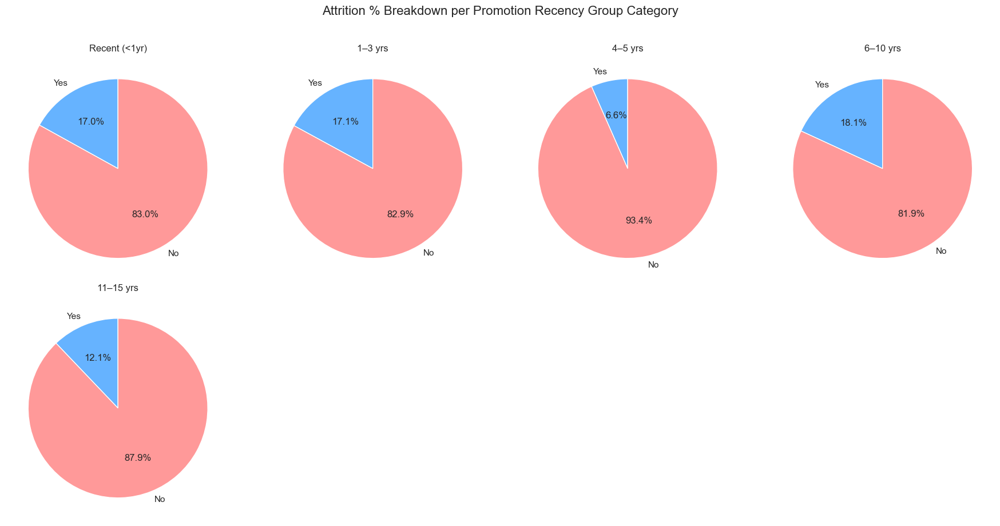

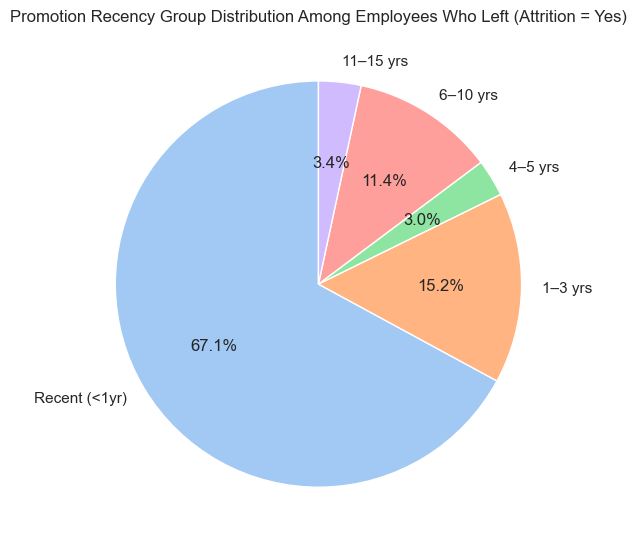


📊 Visualizing: Years With Current Manager Group


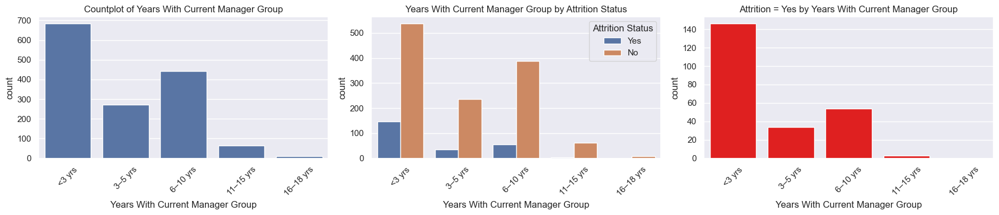

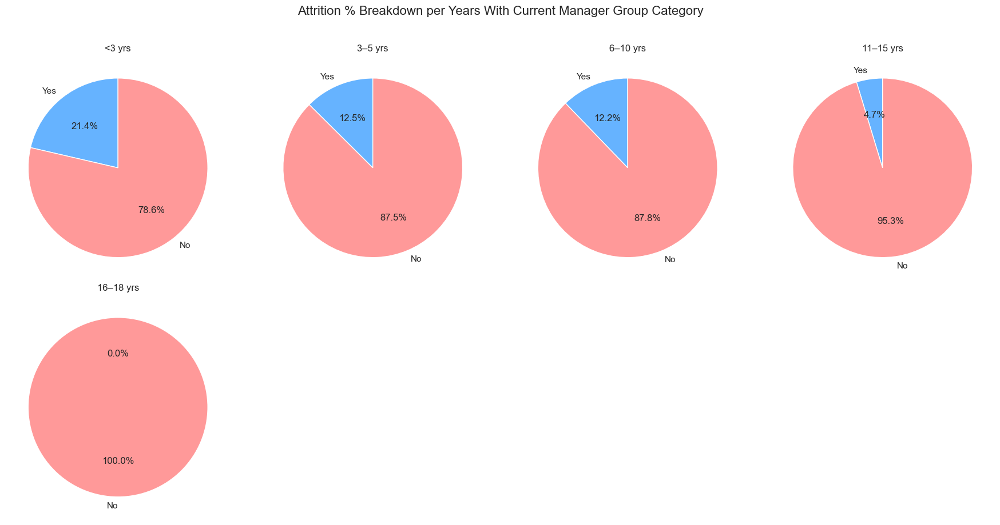

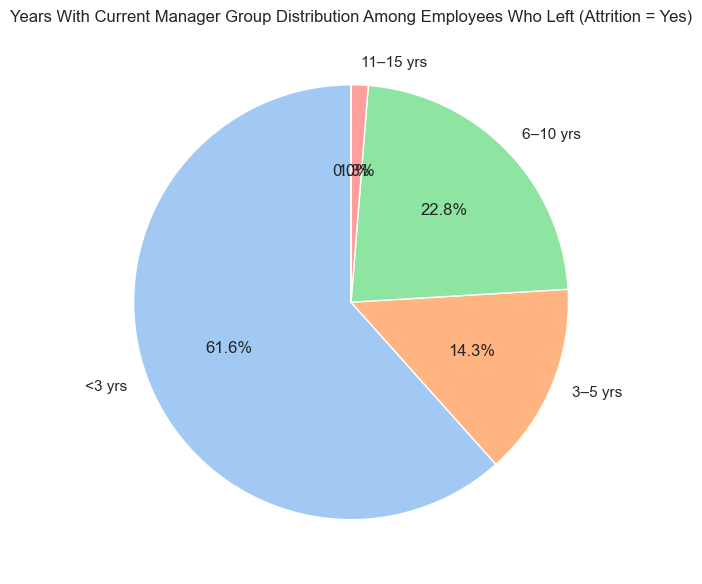

In [43]:
# List of categorical columns
categorical_cols = list(category_orders.keys())
categorical_cols.remove("Attrition Status")

# Apply plots
for col in categorical_cols:
    print(f"\n📊 Visualizing: {col}")
    plot_categorical_features(df, col)

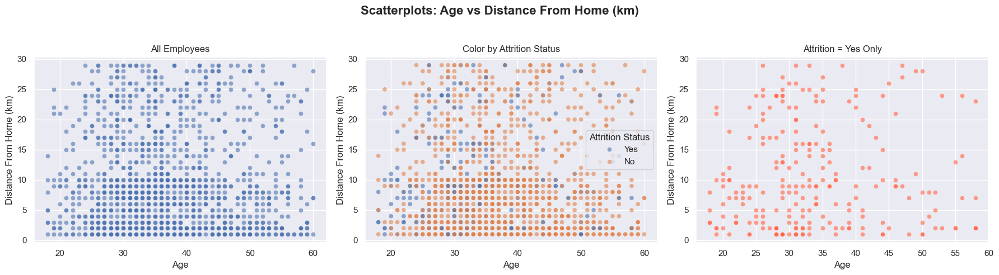

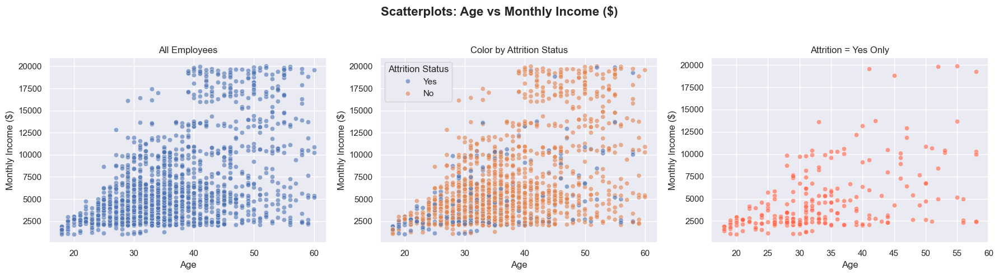

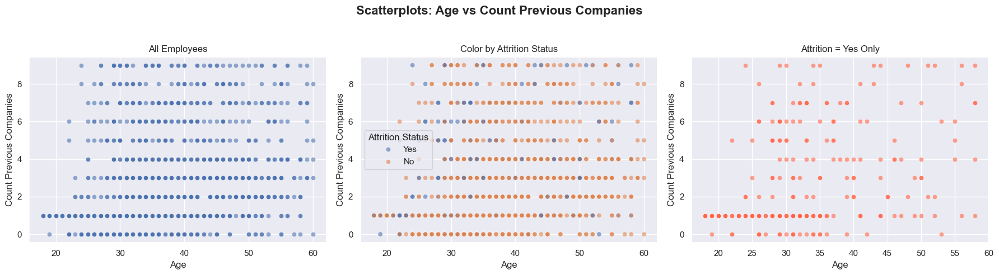

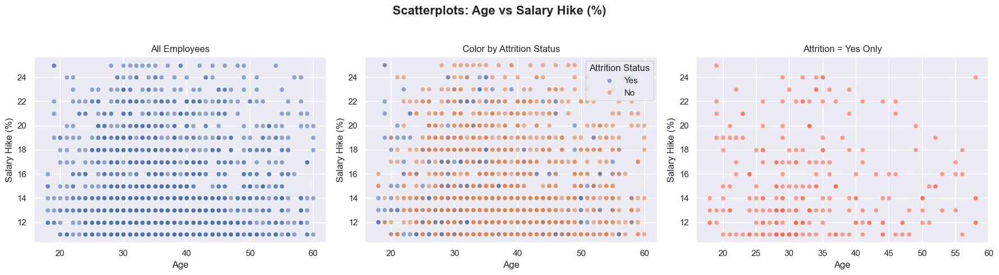

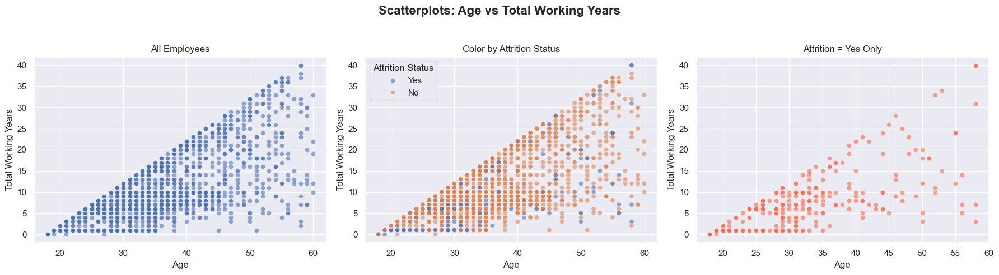

...

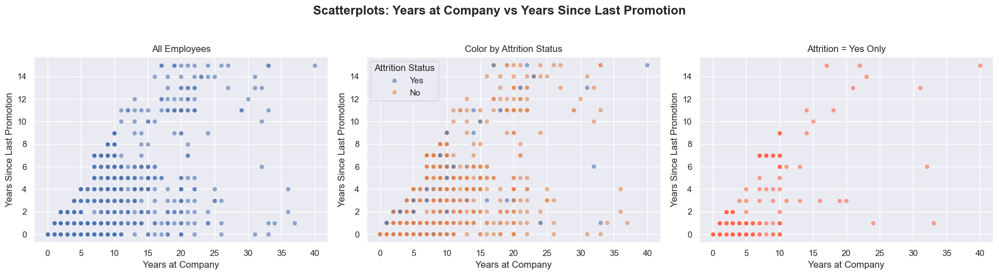

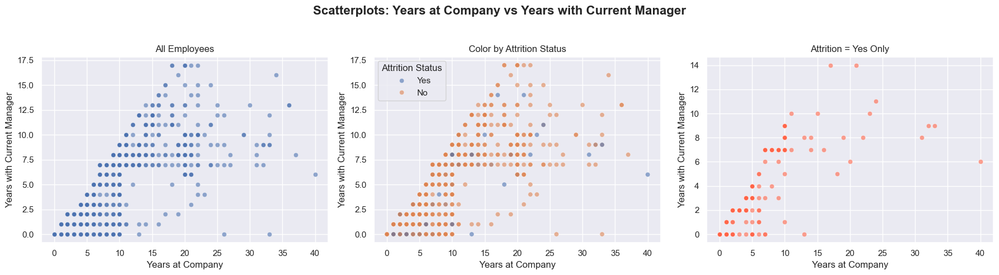

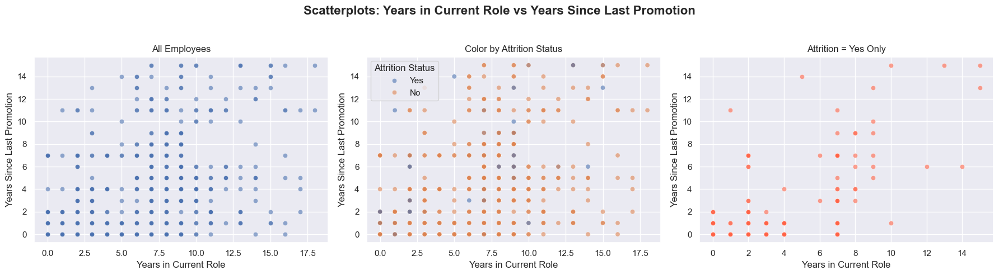

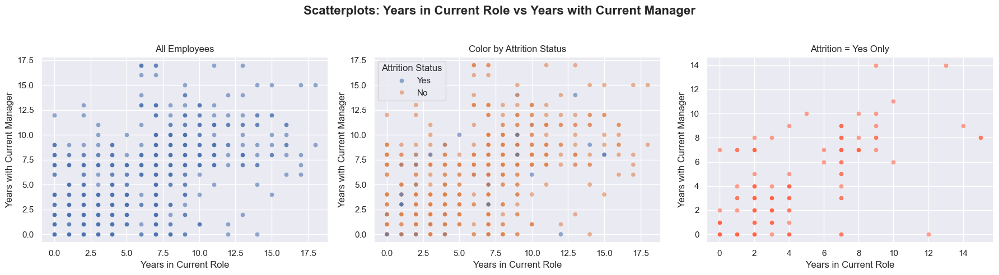

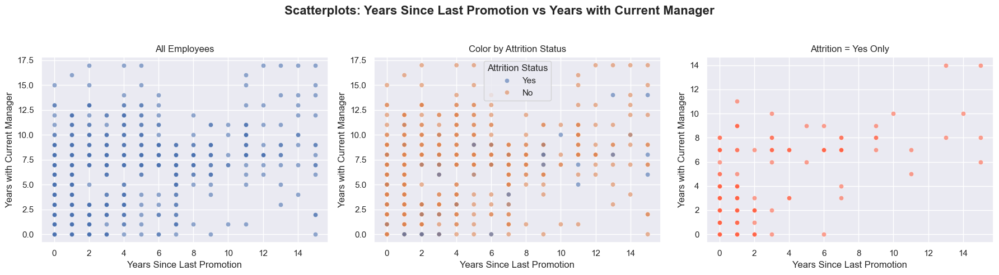

In [44]:
plot_all_scatterplots(df)

# Plotly Visualization